# **Hanan Fared Mohamed Omara.     ID:20398559**

## **Import Libraries**

In [1]:
import json
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [2]:
!pip install transformers[torch] accelerate==0.20.1


In [3]:
from transformers import AutoTokenizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

# <font color="blue" size="5"> **Question 1**</font>


 > **Our goal is to perform natural language inference on the
given task. The first task is to check the `statistics` of the dataset and
design how to generate new files from the raw dataset to support your
NLI task `training`, `validation` and `testing`. You should have a textual
cell in your notebook to summarize your approach (how you prepare the
train/test/validation set).**

## **Convert Json file to csv file and read Dataset**

In [4]:
# Open the JSON file and load the data
with open('/content/train.json', 'r') as f:
    data = json.load(f)


# Extracting the relevant information from the JSON data
rows = []
for document in data["documents"]:
    doc_text = document["text"]
    annotations = document["annotation_sets"][0]["annotations"]
    for annotation_id, annotation_data in annotations.items():
        hypothesis = data["labels"][annotation_id]["hypothesis"]
        choice = annotation_data["choice"]
        evidence_spans = annotation_data["spans"]
        rows.append([doc_text, hypothesis, choice, evidence_spans])

# Converting to a DataFrame
df = pd.DataFrame(rows, columns=["text", "hypothesis", "label", "evidence_spans"])

# Save DataFrame to CSV
csv_file_path = "data.csv"
df.to_csv(csv_file_path, index=False)

# Read the CSV data
train_df = pd.read_csv(csv_file_path)

# Display the read data
train_df

,text,hypothesis,label,evidence_spans
0,NON-DISCLOSURE AND CONFIDENTIALITY AGREEMENT\n...,Receiving Party shall not reverse engineer any...,NotMentioned,[]
1,NON-DISCLOSURE AND CONFIDENTIALITY AGREEMENT\n...,Receiving Party shall destroy or return some C...,Entailment,"[39, 40]"
2,NON-DISCLOSURE AND CONFIDENTIALITY AGREEMENT\n...,Agreement shall not grant Receiving Party any ...,Entailment,[38]
3,NON-DISCLOSURE AND CONFIDENTIALITY AGREEMENT\n...,Receiving Party shall not disclose the fact th...,Entailment,[51]
4,NON-DISCLOSURE AND CONFIDENTIALITY AGREEMENT\n...,Confidential Information shall only include te...,NotMentioned,[]
...,...,...,...,...
7186,Exhibit (d)(3)\nNON-DISCLOSURE AGREEMENT\nThis...,Receiving Party may create a copy of some Conf...,NotMentioned,[]
7187,Exhibit (d)(3)\nNON-DISCLOSURE AGREEMENT\nThis...,Receiving Party shall notify Disclosing Party ...,Entailment,[30]
7188,Exhibit (d)(3)\nNON-DISCLOSURE AGREEMENT\nThis...,Receiving Party may acquire information simila...,Entailment,"[98, 101]"
7189,Exhibit (d)(3)\nNON-DISCLOSURE AGREEMENT\nThis...,Receiving Party may share some Confidential In...,Entailment,"[24, 25, 104, 105, 106]"


In [5]:
# Open the JSON file and load the data
with open('/content/dev.json', 'r') as f:
    data = json.load(f)


# Extracting the relevant information from the JSON data
rows = []
for document in data["documents"]:
    doc_text = document["text"]
    annotations = document["annotation_sets"][0]["annotations"]
    for annotation_id, annotation_data in annotations.items():
        hypothesis = data["labels"][annotation_id]["hypothesis"]
        choice = annotation_data["choice"]
        evidence_spans = annotation_data["spans"]
        rows.append([doc_text, hypothesis, choice, evidence_spans])

# Converting to a DataFrame
df = pd.DataFrame(rows, columns=["text", "hypothesis", "label", "evidence_spans"])

# Save DataFrame to CSV
csv_file_path = "data.csv"
df.to_csv(csv_file_path, index=False)

# Read the CSV data
validation_df = pd.read_csv(csv_file_path)

# Display the read data
validation_df

,text,hypothesis,label,evidence_spans
0,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall not reverse engineer any...,Entailment,"[33, 39]"
1,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall destroy or return some C...,Entailment,[47]
2,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Agreement shall not grant Receiving Party any ...,Entailment,[51]
3,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall not disclose the fact th...,Entailment,"[89, 90]"
4,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Confidential Information shall only include te...,Contradiction,[17]
...,...,...,...,...
1032,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may create a copy of some Conf...,NotMentioned,[]
1033,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party shall notify Disclosing Party ...,Entailment,"[28, 29]"
1034,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may acquire information simila...,Entailment,"[12, 15, 16, 42, 46, 47, 48, 49]"
1035,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may share some Confidential In...,Entailment,"[5, 20]"


In [6]:
# Open the JSON file and load the data
with open('/content/test.json', 'r') as f:
    data = json.load(f)


# Extracting the relevant information from the JSON data
rows = []
for document in data["documents"]:
    doc_text = document["text"]
    annotations = document["annotation_sets"][0]["annotations"]
    for annotation_id, annotation_data in annotations.items():
        hypothesis = data["labels"][annotation_id]["hypothesis"]
        choice = annotation_data["choice"]
        evidence_spans = annotation_data["spans"]
        rows.append([doc_text, hypothesis, choice, evidence_spans])

# Converting to a DataFrame
df = pd.DataFrame(rows, columns=["text", "hypothesis", "label", "evidence_spans"])

# Save DataFrame to CSV
csv_file_path = "data.csv"
df.to_csv(csv_file_path, index=False)

# Read the CSV data
test_df = pd.read_csv(csv_file_path)

# Display the read data
test_df


,text,hypothesis,label,evidence_spans
0,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall not reverse engineer any...,NotMentioned,[]
1,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall destroy or return some C...,Entailment,"[84, 85, 86]"
2,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Agreement shall not grant Receiving Party any ...,Entailment,[45]
3,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall not disclose the fact th...,NotMentioned,[]
4,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Confidential Information shall only include te...,Contradiction,"[25, 32]"
...,...,...,...,...
2086,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may create a copy of some Conf...,NotMentioned,[]
2087,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party shall notify Disclosing Party ...,Entailment,[32]
2088,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may acquire information simila...,Entailment,"[15, 19]"
2089,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may share some Confidential In...,Entailment,"[14, 30]"



# <font color="blue" size="5"> **summarixze the approache**</font>


>  **To prepare the train/test/validation sets, we can use the provided JSON data, which contains information about documents, annotations, and labels. The JSON data consists of the following key components:**




1. "documents": This contains information about individual documents, including text, file name, document type, URL, and spans.

2. "labels": This contains labels corresponding to the annotations. It includes a short description and a hypothesis for each label.

3. "annotation_sets": This contains annotations for each document, indicating choices and evidence spans.




> **To prepare the train/test/validation sets, we can follow these steps:**


1. Data extraction: We iterate through the "documents" in the JSON data and extract the relevant information, including "text," "hypothesis," "choice," and "evidence_spans."

2. Data organization: We organize the extracted data into rows, where each row corresponds to an annotation with its associated document's "text," "hypothesis," "choice," and "evidence_spans."

3. Splitting the data: We can split the data into training, testing, and validation sets. The splitting can be done randomly, ensuring that each set has a representative distribution of annotations.

4. Data representation: We can represent the data in a tabular format (e.g., a CSV file) where each row represents an annotation, and the columns are "text," "hypothesis," "choice," and "evidence_spans."

5. Saving to CSV: The prepared data can be saved as separate CSV files for the train, test, and validation sets.




> In the provided code example, we focused on extracting the `relevant information` from the JSON data, organizing it into rows, and then saving it as a CSV file with four columns: "text," "hypothesis," "choice," and "evidence_spans."



### **Check the statistics of the Train dataset.**

In [ ]:
train_df.describe()

,text,hypothesis,label,evidence_spans
count,7191,7191,7191,7191
unique,423,17,3,1222
top,NON-DISCLOSURE AND CONFIDENTIALITY AGREEMENT\n...,Receiving Party shall not reverse engineer any...,Entailment,[]
freq,17,423,3530,2820


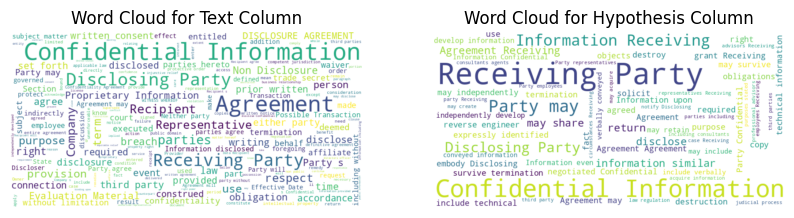

In [ ]:
# Create a WordCloud object for text column
text_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(train_df['text']))

# Create a WordCloud object for hypothesis column
hypothesis_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(train_df['hypothesis']))

# Plot the word clouds
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(text_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Text Column')

plt.subplot(1, 2, 2)
plt.imshow(hypothesis_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Hypothesis Column')

plt.show()

In [ ]:
def check_dataset_statistics(dataset_path):


    # Get the number of rows and columns in the dataset
    num_rows, num_columns = train_df.shape

    # Calculate the number of unique values for each column
    num_unique_values = train_df.nunique()

    # Calculate the distribution of the "label" column
    label_distribution = train_df['label'].value_counts()

    # Calculate statistics for the "evidence_spans" column
    num_non_empty_spans = train_df['evidence_spans'].apply(lambda x: len(eval(x))).sum()
    total_spans = train_df['evidence_spans'].apply(lambda x: len(eval(x))).count()

    # Print the statistics
    print("Dataset Statistics:")
    print(f"Number of Rows: {num_rows}")
    print(f"Number of Columns: {num_columns}")
    print(" ")
    print(f"Number of Unique Values for each Column:")
    print(num_unique_values)
    print(" ")
    print("Distribution of'label' Column:")
    print(label_distribution)
    print(" ")
    print(f"Total Evidence Spans: {num_non_empty_spans}")
    print(" ")
    print(f"Total Annotations: {total_spans}")

# Replace 'dataset.csv' with the path to your CSV file containing the dataset
dataset_path = '/content/train.json'
check_dataset_statistics(dataset_path)


Dataset Statistics:
Number of Rows: 7191
Number of Columns: 4
 
Number of Unique Values for each Column:
text               423
hypothesis          17
label                3
evidence_spans    1222
dtype: int64
 
Distribution of'label' Column:
Entailment       3530
NotMentioned     2820
Contradiction     841
Name: label, dtype: int64
 
Total Evidence Spans: 8341
 
Total Annotations: 7191


Label Distribution:
Entailment       3530
NotMentioned     2820
Contradiction     841
Name: label, dtype: int64

Label Percentages:
Entailment       49.089139
NotMentioned     39.215686
Contradiction    11.695175
Name: label, dtype: float64


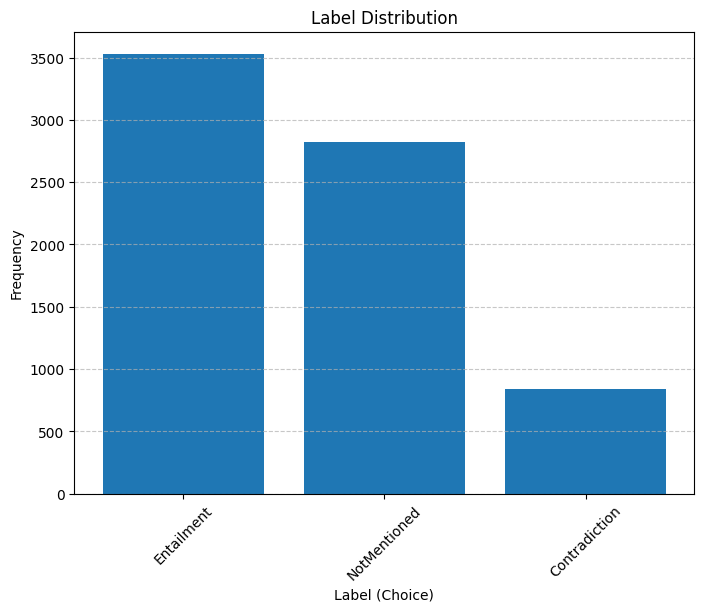

The label distribution is not perfectly balanced.


In [ ]:
def check_label_balance(dataset_path):

    # Calculate the distribution of the "choice" column
    label_distribution = train_df['label'].value_counts()

    # Calculate the percentage of each label in the "choice" column
    label_percentages = label_distribution / label_distribution.sum() * 100

    # Check if the labels are balanced (within a certain tolerance)
    is_balanced = all(label_percentages >= (100 / len(label_percentages)) - 5)

    # Print the label distribution
    print("Label Distribution:")
    print(label_distribution)
    print("\nLabel Percentages:")
    print(label_percentages)

    # Plot the label distribution as a bar chart
    plt.figure(figsize=(8, 6))
    plt.bar(label_distribution.index, label_distribution.values)
    plt.xlabel("Label (Choice)")
    plt.ylabel("Frequency")
    plt.title("Label Distribution")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    return is_balanced

# Replace 'dataset.csv' with the path to your CSV file containing the dataset
dataset_path = '/content/train.json'
is_balanced = check_label_balance(dataset_path)

if is_balanced:
    print("The label distribution is balanced.")
else:
    print("The label distribution is not perfectly balanced.")


### **Check the statistics of the Test dataset.**

In [ ]:
test_df.describe()

,text,hypothesis,label,evidence_spans
count,2091,2091,2091,2091
unique,122,17,3,533
top,DEPARTMENT OF HOMELAND SECURITY\nNON-DISCLOSUR...,Receiving Party shall not reverse engineer any...,Entailment,[]
freq,34,123,968,903


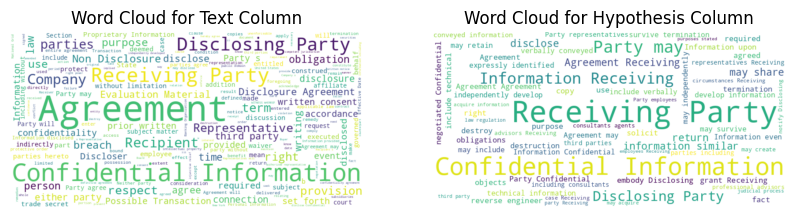

In [ ]:
# Create a WordCloud object for text column
text_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(test_df['text']))

# Create a WordCloud object for hypothesis column
hypothesis_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(test_df['hypothesis']))

# Plot the word clouds
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(text_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Text Column')

plt.subplot(1, 2, 2)
plt.imshow(hypothesis_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Hypothesis Column')

plt.show()

In [ ]:
def check_dataset_statistics(dataset_path):


    # Get the number of rows and columns in the dataset
    num_rows, num_columns = train_df.shape

    # Calculate the number of unique values for each column
    num_unique_values = train_df.nunique()

    # Calculate the distribution of the "choice" column
    choice_distribution = train_df['label'].value_counts()

    # Calculate statistics for the "evidence_spans" column
    num_non_empty_spans = train_df['evidence_spans'].apply(lambda x: len(eval(x))).sum()
    total_spans = train_df['evidence_spans'].apply(lambda x: len(eval(x))).count()

    # Print the statistics
    print("Dataset Statistics:")
    print(f"Number of Rows: {num_rows}")
    print(f"Number of Columns: {num_columns}")
    print(" ")
    print(f"Number of Unique Values for each Column:")
    print(num_unique_values)
    print(" ")
    print("Distribution of 'choice' Column:")
    print(choice_distribution)
    print(" ")
    print(f"Total Evidence Spans: {num_non_empty_spans}")
    print(" ")
    print(f"Total Annotations: {total_spans}")

# Replace 'dataset.csv' with the path to your CSV file containing the dataset
dataset_path = '/content/test.json'
check_dataset_statistics(dataset_path)


Dataset Statistics:
Number of Rows: 7191
Number of Columns: 4
 
Number of Unique Values for each Column:
text               423
hypothesis          17
label                3
evidence_spans    1222
dtype: int64
 
Distribution of 'choice' Column:
Entailment       3530
NotMentioned     2820
Contradiction     841
Name: label, dtype: int64
 
Total Evidence Spans: 8341
 
Total Annotations: 7191


Label Distribution:
Entailment       3530
NotMentioned     2820
Contradiction     841
Name: label, dtype: int64

Label Percentages:
Entailment       49.089139
NotMentioned     39.215686
Contradiction    11.695175
Name: label, dtype: float64


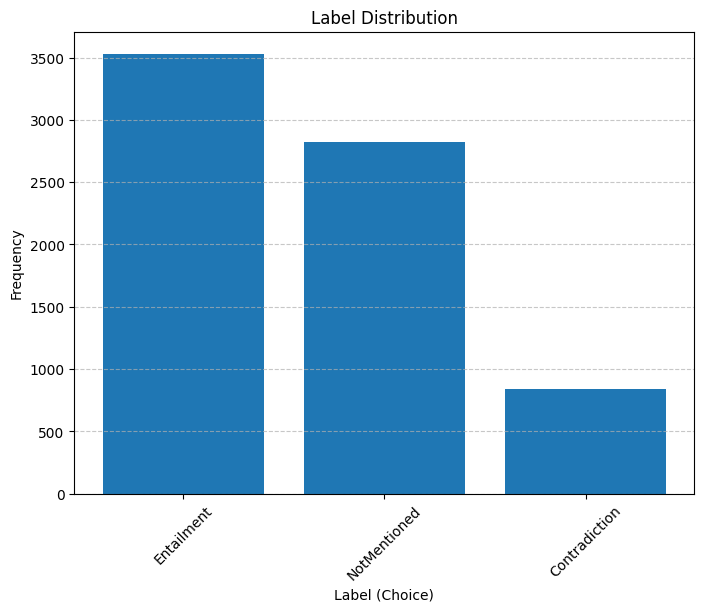

The label distribution is not perfectly balanced.


In [ ]:
def check_label_balance(dataset_path):

    # Calculate the distribution of the "choice" column
    label_distribution = train_df['label'].value_counts()

    # Calculate the percentage of each label in the "choice" column
    label_percentages = label_distribution / label_distribution.sum() * 100

    # Check if the labels are balanced (within a certain tolerance)
    is_balanced = all(label_percentages >= (100 / len(label_percentages)) - 5)

    # Print the label distribution
    print("Label Distribution:")
    print(label_distribution)
    print("\nLabel Percentages:")
    print(label_percentages)

    # Plot the label distribution as a bar chart
    plt.figure(figsize=(8, 6))
    plt.bar(label_distribution.index, label_distribution.values)
    plt.xlabel("Label (Choice)")
    plt.ylabel("Frequency")
    plt.title("Label Distribution")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    return is_balanced

# Replace 'dataset.csv' with the path to your CSV file containing the dataset
dataset_path = '/content/test.json'
is_balanced = check_label_balance(dataset_path)

if is_balanced:
    print("The label distribution is balanced.")
else:
    print("The label distribution is not perfectly balanced.")


### **Check the statistics of the Validation dataset.**

In [ ]:
validation_df.describe()

,text,hypothesis,label,evidence_spans
count,1037,1037,1037,1037
unique,61,17,3,325
top,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall not reverse engineer any...,Entailment,[]
freq,17,61,519,423


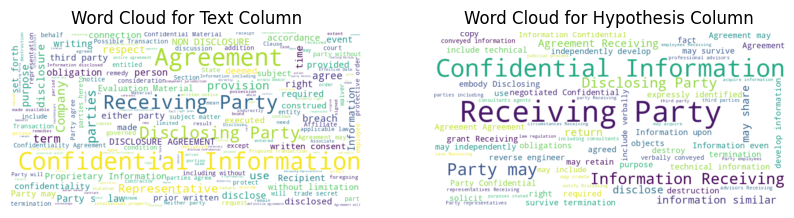

In [ ]:
# Create a WordCloud object for text column
text_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(validation_df['text']))

# Create a WordCloud object for hypothesis column
hypothesis_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(validation_df['hypothesis']))

# Plot the word clouds
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(text_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Text Column')

plt.subplot(1, 2, 2)
plt.imshow(hypothesis_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Hypothesis Column')

plt.show()

In [ ]:
def check_dataset_statistics(dataset_path):


    # Get the number of rows and columns in the dataset
    num_rows, num_columns = train_df.shape

    # Calculate the number of unique values for each column
    num_unique_values = train_df.nunique()

    # Calculate the distribution of the "choice" column
    choice_distribution = train_df['label'].value_counts()

    # Calculate statistics for the "evidence_spans" column
    num_non_empty_spans = train_df['evidence_spans'].apply(lambda x: len(eval(x))).sum()
    total_spans = train_df['evidence_spans'].apply(lambda x: len(eval(x))).count()

    # Print the statistics
    print("Dataset Statistics:")
    print(f"Number of Rows: {num_rows}")
    print(f"Number of Columns: {num_columns}")
    print(" ")
    print(f"Number of Unique Values for each Column:")
    print(num_unique_values)
    print(" ")
    print("Distribution of 'choice' Column:")
    print(choice_distribution)
    print(" ")
    print(f"Total Evidence Spans: {num_non_empty_spans}")
    print(" ")
    print(f"Total Annotations: {total_spans}")

# Replace 'dataset.csv' with the path to your CSV file containing the dataset
dataset_path = '/content/dev.json'
check_dataset_statistics(dataset_path)


Dataset Statistics:
Number of Rows: 7191
Number of Columns: 4
 
Number of Unique Values for each Column:
text               423
hypothesis          17
label                3
evidence_spans    1222
dtype: int64
 
Distribution of 'choice' Column:
Entailment       3530
NotMentioned     2820
Contradiction     841
Name: label, dtype: int64
 
Total Evidence Spans: 8341
 
Total Annotations: 7191


Label Distribution:
Entailment       3530
NotMentioned     2820
Contradiction     841
Name: label, dtype: int64

Label Percentages:
Entailment       49.089139
NotMentioned     39.215686
Contradiction    11.695175
Name: label, dtype: float64


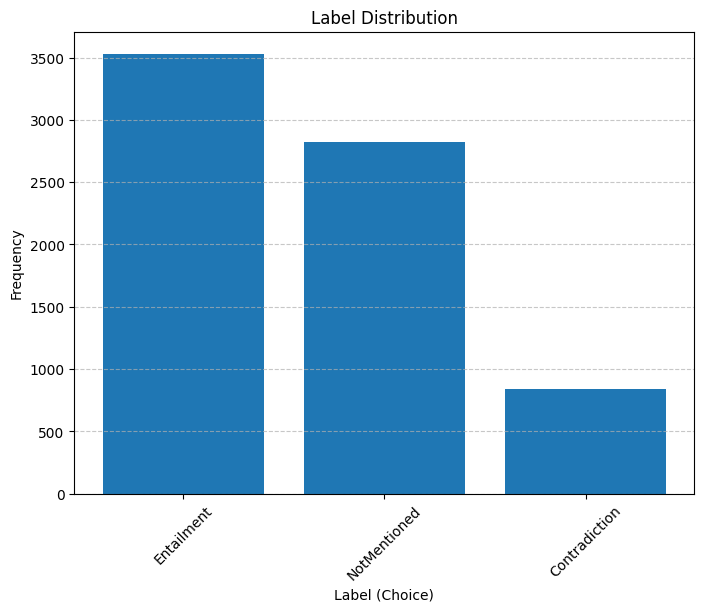

The label distribution is not perfectly balanced.


In [ ]:
def check_label_balance(dataset_path):

    # Calculate the distribution of the "choice" column
    label_distribution = train_df['label'].value_counts()

    # Calculate the percentage of each label in the "choice" column
    label_percentages = label_distribution / label_distribution.sum() * 100

    # Check if the labels are balanced (within a certain tolerance)
    is_balanced = all(label_percentages >= (100 / len(label_percentages)) - 5)

    # Print the label distribution
    print("Label Distribution:")
    print(label_distribution)
    print("\nLabel Percentages:")
    print(label_percentages)

    # Plot the label distribution as a bar chart
    plt.figure(figsize=(8, 6))
    plt.bar(label_distribution.index, label_distribution.values)
    plt.xlabel("Label (Choice)")
    plt.ylabel("Frequency")
    plt.title("Label Distribution")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    return is_balanced

# Replace 'dataset.csv' with the path to your CSV file containing the dataset
dataset_path = '/content/dev.json'
is_balanced = check_label_balance(dataset_path)

if is_balanced:
    print("The label distribution is balanced.")
else:
    print("The label distribution is not perfectly balanced.")


# <font color="blue" size="5"> **Question 2**</font>

>  Perform NLI using two transformer based approaches. You
can check the SOTA approaches from paperwithcode and then see if hugging face has implemented the pre-trained model. If you pick a pre-trained
model such as DeBerta (https://huggingface.co/docs/transformers/model doc/deberta),
make sure you fine-tuned the model on the training dataset. You are free
to use public available model/code to implement your solution. Report
the performance of two models on the dataset.


# <font color="blue" size="5"> **First Model**</font>


In [ ]:
model_name = "microsoft/deberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name)

In [ ]:
def tokenize_data(data):
    #the text and hypothesis will speperated by [sep] token to differentiate them.
    return tokenizer(text=data['text'].tolist(), text_pair=data['hypothesis'].tolist(), truncation=True, padding="max_length", max_length=512)

In [ ]:
#example of how is the structure of the data generated by tokenizer function.
{
  'input_ids': [101, 1037, 4715, 2208, 2007, 3674, 3287, 2652, 1012, 102, 2070, 2273, 2024, 2652, 1037, 4368, 1012, 102],
  'tokens': ['[CLS]', 'a', 'soccer', 'game', 'with', 'multiple', 'males', 'playing', '.', '[SEP]', 'some', 'men', 'are', 'playing', 'a', 'sport', '.', '[SEP]'],
  'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
  'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
  'special_tokens_mask': [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]
}

{'input_ids': [101,
  1037,
  4715,
  2208,
  2007,
  3674,
  3287,
  2652,
  1012,
  102,
  2070,
  2273,
  2024,
  2652,
  1037,
  4368,
  1012,
  102],
 'tokens': ['[CLS]',
  'a',
  'soccer',
  'game',
  'with',
  'multiple',
  'males',
  'playing',
  '.',
  '[SEP]',
  'some',
  'men',
  'are',
  'playing',
  'a',
  'sport',
  '.',
  '[SEP]'],
 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
 'special_tokens_mask': [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]}

In [ ]:
class ContractNLIDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(value[idx]) for key, value in self.encodings.items()}
        # Here we ensure the label is an integer tensor
        item['labels'] = torch.tensor(int(self.labels[idx]))
        return item

    def __len__(self):
        return len(self.labels)

In [ ]:
label_mapping = {"NotMentioned": 0, "Entailment": 1, "Contradiction": 2}

train_labels = [label_mapping[label] for label in train_df['label'].tolist()]
valid_labels = [label_mapping[label] for label in validation_df['label'].tolist()]
train_encodings = tokenize_data(train_df)
valid_encodings = tokenize_data(validation_df)

In [ ]:
train_dataset = ContractNLIDataset(train_encodings, train_labels)
valid_dataset = ContractNLIDataset(valid_encodings, valid_labels)

In [ ]:
train_dataset.encodings[0]

Encoding(num_tokens=512, attributes=[ids, type_ids, tokens, offsets, attention_mask, special_tokens_mask, overflowing])

In [ ]:
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3)


training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=4,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
    evaluation_strategy="epoch",
)
def compute_metrics(p):
    preds = np.argmax(p.predictions, axis=1)
    return {"accuracy": (preds == p.label_ids).mean()}
# def compute_metrics(p):
#     preds = np.argmax(p.predictions, axis=1)
#     precision, recall, f1_score, _ = precision_recall_fscore_support(p.label_ids, preds, average=None)
#     accuracy = (preds == p.label_ids).mean()
#     return {"accuracy": accuracy, "precision": precision, "recall": recall, "f1_score": f1_score}

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)

trainer.train()


Some weights of the model checkpoint at microsoft/deberta-base were not used when initializing DebertaForSequenceClassification: ['lm_predictions.lm_head.dense.bias', 'lm_predictions.lm_head.LayerNorm.bias', 'lm_predictions.lm_head.dense.weight', 'lm_predictions.lm_head.LayerNorm.weight', 'lm_predictions.lm_head.bias']
- This IS expected if you are initializing DebertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DebertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DebertaForSequenceClassification were not initialized from the model checkpoint at microsoft/deberta-base and are newly initialized: ['classifier.bias', 'classifier

Epoch,Training Loss,Validation Loss,Accuracy
1,0.624900,0.713224,0.672131
2,0.584700,0.700614,0.710704
3,0.630200,0.665930,0.712633
4,0.558200,0.678411,0.712633


TrainOutput(global_step=3596, training_loss=0.6520694137547782, metrics={'train_runtime': 4935.3299, 'train_samples_per_second': 5.828, 'train_steps_per_second': 0.729, 'total_flos': 8819041295462400.0, 'train_loss': 0.6520694137547782, 'epoch': 4.0})

### **Predict on Test dataset**

In [ ]:
model.to(torch.device("cuda"))



DebertaForSequenceClassification(
  (deberta): DebertaModel(
    (embeddings): DebertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=0)
      (LayerNorm): DebertaLayerNorm()
      (dropout): StableDropout()
    )
    (encoder): DebertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x DebertaLayer(
          (attention): DebertaAttention(
            (self): DisentangledSelfAttention(
              (in_proj): Linear(in_features=768, out_features=2304, bias=False)
              (pos_dropout): StableDropout()
              (pos_proj): Linear(in_features=768, out_features=768, bias=False)
              (pos_q_proj): Linear(in_features=768, out_features=768, bias=True)
              (dropout): StableDropout()
            )
            (output): DebertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): DebertaLayerNorm()
              (dropout): StableDropout()
            )
          )
          (

In [ ]:
test_labels = [label_mapping[label] for label in test_df['label'].tolist()]
test_encodings = tokenize_data(test_df)
test_dataset = ContractNLIDataset(test_encodings, test_labels)


In [ ]:

# Create a DataLoader for the test dataset
from torch.utils.data import DataLoader
test_dataloader = DataLoader(test_dataset, batch_size=8)

# Put the model in evaluation mode
model.eval()

# Lists to store predictions and true labels
predictions = []
true_labels = []

# Make predictions on the test dataset
with torch.no_grad():
    for batch in test_dataloader:
        inputs = {key: value.to('cuda') for key, value in batch.items() if key != 'labels'}
        labels = batch['labels'].to('cuda')
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_labels = torch.argmax(logits, dim=1)
        predictions.extend(predicted_labels.cpu().tolist())
        true_labels.extend(labels.cpu().tolist())

# Convert the predictions and true labels to numpy arrays
predictions = np.array(predictions)
true_labels = np.array(true_labels)

# Compute accuracy and other metrics
accuracy = accuracy_score(true_labels, predictions)
precision, recall, f1_score, _ = precision_recall_fscore_support(true_labels, predictions, average='weighted')

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)


Accuracy: 0.743663318986131
Precision: 0.7463983106640684
Recall: 0.743663318986131
F1 Score: 0.7446114428273354


In [ ]:
predictions.shape

(2091,)

In [ ]:
true_labels.shape

(2091,)

In [ ]:
# Convert the predicted labels and true labels to a DataFrame
results_test_1 = pd.DataFrame({'predictions': predictions, 'true_labels': true_labels})
results_test_1

,predictions,true_labels
0,0,0
1,0,1
2,1,1
3,0,0
4,2,2
...,...,...
2086,0,0
2087,1,1
2088,1,1
2089,1,1


In [ ]:
# Save DataFrame to a CSV file
results_test_1.to_csv('results_test_1.csv', index=False)

In [ ]:
# Read the CSV data
results_test_1 = pd.read_csv('/content/results_test_1.csv')

# Display the read data
results_test_1

,predictions,true_labels
0,0,0
1,0,1
2,1,1
3,0,0
4,2,2
...,...,...
2086,0,0
2087,1,1
2088,1,1
2089,1,1


In [ ]:
# Assuming you have the predicted labels in a list called 'predicted_labels_list'
test_df['predictions'] =results_test_1['predictions']
test_df['true_labels'] = results_test_1['true_labels']

In [ ]:
test_df

,text,hypothesis,label,evidence_spans,predictions,true_labels
0,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall not reverse engineer any...,NotMentioned,[],0,0
1,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall destroy or return some C...,Entailment,"[84, 85, 86]",0,1
2,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Agreement shall not grant Receiving Party any ...,Entailment,[45],1,1
3,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall not disclose the fact th...,NotMentioned,[],0,0
4,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Confidential Information shall only include te...,Contradiction,"[25, 32]",2,2
...,...,...,...,...,...,...
2086,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may create a copy of some Conf...,NotMentioned,[],0,0
2087,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party shall notify Disclosing Party ...,Entailment,[32],1,1
2088,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may acquire information simila...,Entailment,"[15, 19]",1,1
2089,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may share some Confidential In...,Entailment,"[14, 30]",1,1


In [ ]:
results_test_1 = test_df.copy()

# Save DataFrame to a CSV file
results_test_1.to_csv('results_test_1.csv', index=False)

### **Observation**

> I have trained a sequence classification model using the DeBERTa-base model and evaluated it on the test dataset.

- Here's a summary of the key steps you performed:

  1. Data Preparation: I converted the JSON files (train.json, dev.json, and test.json) into CSV format, extracting relevant information such as text, hypothesis, choice, and evidence spans. Then you tokenized the data using the DeBERTa tokenizer, resulting in tokenized encodings for each dataset (train, validation, and test).

  2. Dataset and Model Setup: I created a custom dataset class (ContractNLIDataset) to handle the tokenized encodings and labels. You also loaded the DeBERTa-base model for sequence classification, specifying the number of labels (3 in this case) since you have a multi-class classification task.

  3. Training: I used the Trainer class from the Hugging Face Transformers library to train the DeBERTa model on the training dataset (train_dataset) and evaluated it on the validation dataset (valid_dataset) for four epochs. During training, you computed accuracy as the evaluation metric.

  4. Test Predictions: I performed predictions on the test dataset using the trained model, calculated various evaluation metrics (accuracy, precision, recall, and F1 score), and printed the results.

> **Results:**
- Training Loss **decreased** from 0.625 in Epoch 1 to 0.558 in Epoch 4.
- Validation Loss also **decreased** from 0.713 in Epoch 1 to 0.678 in Epoch 4.
- The accuracy on the `validation dataset` **hovered around 0.71** throughout the training.

> **Test Results**
- Accuracy on the test dataset: 0.744
- Precision (weighted average): 0.746
- Recall (weighted average): 0.744
- F1 Score (weighted average): 0.745

- Overall, the model seems to have performed `reasonably well` on the test dataset. An accuracy of around `0.744` indicates that the model can correctly classify the majority of the samples in the test dataset.



# <font color="blue" size="5"> **Question 3**</font>

>   perform error analysis. You should have a textual cell explaining how you design the methodology to perform error analysis with a goal of understanding what are the potential reasons behind the errors.


Example 1:
Text: NON-DISCLOSURE AGREEMENT
Required under JEA's Confidential Information Protection Program
THIS NON-DISCLOSURE AGREEMENT ("Agreement") is entered into this ______day of
__________ by and between JEA, located at 21 West Church Street, Jacksonville, Florida 32202 (the "Discloser"), and ____________________________________________________________ with an address at ______________________________________________ (the "Recipient") (hereafter Discloser and Recipient shall be referred to as the PARTIES}.
WHEREAS, the Recipient desires to work with the discloser and/or view ______________________________________________________________________documents regarding ____________________________________ (the "Transaction"); and
WHEREAS, the discloser is required by its internal policies, state and federal laws, rules, regulations or standards to ensure that sensitive and confidential information is protected and not disclosed to the public;
WHEREAS, the Parties have entered into a t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Hypothesis: Receiving Party shall destroy or return some Confidential Information upon the termination of Agreement.
true_labels: 1
Predicted Label: 0
-----
Example 1023:
Text: Non Disclosure Agreement
Ref M E Benson
And
 Urban Wind Turbines™
Non Disclosure Agreement1
DATE: [ …………… ]2
PARTIES:3
(1) [MEB Engineering & Commercial Services Ltd], a company incorporated in [ U K] (Nr 52109405 ) having its registered office at [Old Pages Cottage c / o P O Box 2184 Maids Moreton Buckingham MK18 9AZ ] (“ The Discloser “)4; and
(2) [ ], a company incorporated in [England and Wales] (registration number ) having its registered office at [……………………………………………………………………………………………………………………………………… ], (the “Recipient”).
AGREEMENT:
1. Definitions
In this Agreement:
“Agreement” means this non disclosure agreement and any amendments to it from time to time;
“Confidential Information” means:
[(a) any information disclosed by [or on behalf of] the Discloser to the Recipient [during the Term / before the end o

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



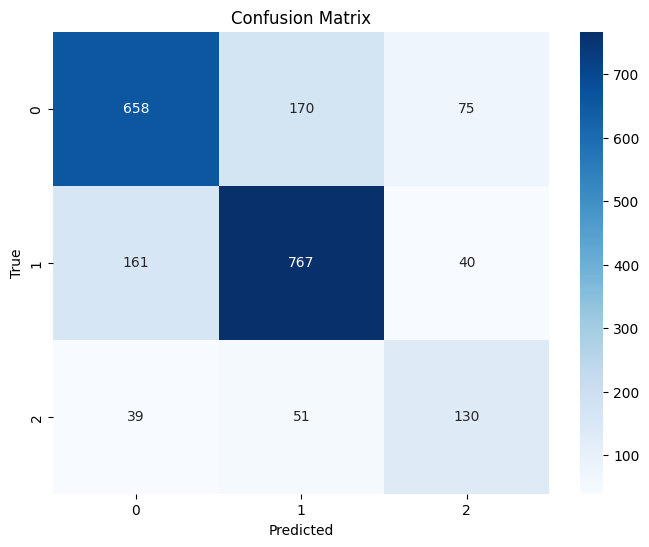

Metrics:
           Class  Precision    Recall  F1-score
0   NotMentioned   0.766900  0.728682  0.747303
1     Entailment   0.776316  0.792355  0.784254
2  Contradiction   0.530612  0.590909  0.559140


<ipython-input-27-f66a41dfa12d>:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)


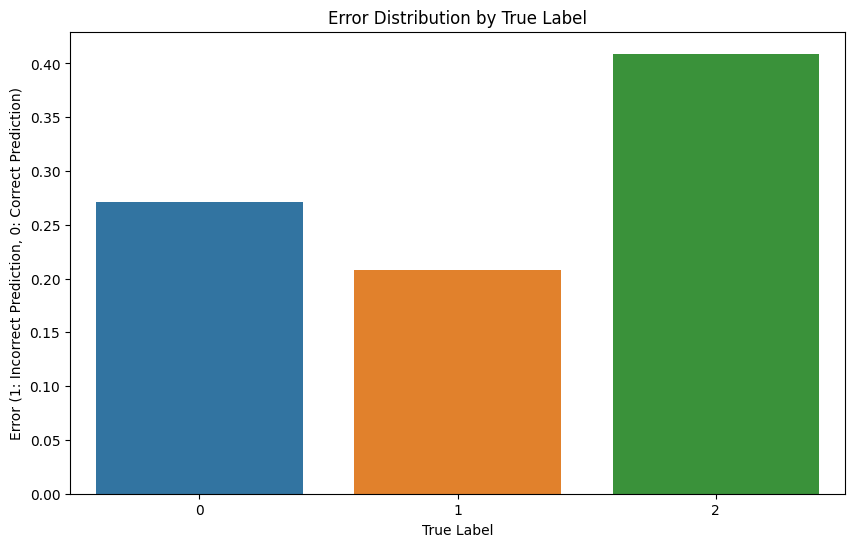

In [ ]:
# Function to analyze errors and create visualizations
def analyze_errors(predictions_df):
    # Filter incorrect predictions
    incorrect_predictions_df = predictions_df[predictions_df['true_labels'] != predictions_df['predictions']]

    # Analyze False Positives and False Negatives
    for index, row in incorrect_predictions_df.iterrows():
        text = row['text']
        hypothesis = row['hypothesis']
        true_labels = row['true_labels']
        predictions = row['predictions']

        print(f"Example {index}:")
        print(f"Text: {text}")
        print(f"Hypothesis: {hypothesis}")
        print(f"true_labels: {true_labels}")
        print(f"Predicted Label: {predictions}")
        print("-----")

    # Create Confusion Matrix
    confusion_matrix = pd.crosstab(predictions_df['true_labels'], predictions_df['predictions'], rownames=['True'], colnames=['Predicted'])
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title("Confusion Matrix")
    plt.show()

    # Calculate Precision, Recall, and F1-score
    precision, recall, f1_score, _ = precision_recall_fscore_support(predictions_df['true_labels'], predictions_df['predictions'], average=None)
    metrics_df = pd.DataFrame({'Class': label_mapping.keys(), 'Precision': precision, 'Recall': recall, 'F1-score': f1_score})
    print("Metrics:")
    print(metrics_df)

    # Visualize Errors
    plt.figure(figsize=(10, 6))
    sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)
    plt.title("Error Distribution by True Label")
    plt.xlabel("True Label")
    plt.ylabel("Error (1: Incorrect Prediction, 0: Correct Prediction)")
    plt.show()

# Assuming you have a DataFrame "results_test_2" with columns 'text', 'hypothesis', 'label', 'predictions'
# Replace the variable name and adjust the columns accordingly

# Call the function to analyze errors and create visualizations
analyze_errors(results_test_1)


### **Observation**

> To perform error analysis on the model's predictions, I have printed out some of the incorrect predictions along with their true labels and predicted labels. This helps me understand where the model is making mistakes.

- **Methodology for Error Analysis:**
  1. Confusion Matrix: I have already created a confusion matrix, which is a great starting point for error analysis. It shows how many instances of each true label were correctly classified and how many were misclassified into other labels.

  2. Misclassified Examples: By printing out some examples of misclassified instances,I can manually review the text, hypothesis, true label, and predicted label to identify patterns or specific areas where the model struggles.

  3. Distribution of Errors: I have visualized the distribution of errors by true labels. This plot shows how many errors are made for each true label. By examining the distribution, I may identify classes with more frequent errors, which can be valuable for targeted improvements.

  4. Metrics: I have calculated precision, recall, and F1-score for each class. These metrics can give me a more detailed understanding of the model's performance on individual classes. Classes with lower precision and recall values may require further investigation.
    

          - Class: NotMentioned
                    - Precision: 0.7669
                    - Recall: 0.7287
                    - F1-score: 0.7473

          - Class: Entailment
                    - Precision: 0.7763
                    - Recall: 0.7924
                    - F1-score: 0.7843

           - Class: Contradiction
                    - Precision: 0.5306
                    - Recall: 0.5909
                    - F1-score: 0.5591

> These results show the precision, recall, and F1-score for each class in the multi-class classification task. Precision represents the accuracy of positive predictions for each class, recall indicates the ability of the model to correctly identify instances of each class, and the F1-score combines both precision and recall to give a balanced measure of the model's performance.


- **Suggested Improvements:**

 1. **Augment the Data**: If certain classes have limited data, I can consider data augmentation techniques to create synthetic examples and balance the dataset. This may improve the model's performance on underrepresented classes.

 2. **Model Fine-Tuning**: Fine-tuning allows the model to adapt better to the specific patterns and characteristics of your data.

 3. **Hyperparameter Tuning**: The performance of the model can be sensitive to hyperparameters. I can perform hyperparameter tuning using techniques like grid search or random search to find the best combination of hyperparameters for The task.

 4. **Error Analysis Visualization**: Consider visualizing attention maps or saliency maps to identify which parts of the input are most influential in the model's predictions. This can help me understand which words or phrases the model is focusing on and potentially improve its decision-making process.

 5. **Data Cleaning**: Review the misclassified examples and check if there are any data quality issues, mislabeled samples, or inconsistencies that might be affecting the model's performance. Cleaning and refining the dataset can have a positive impact.

 6. **Model Ensemble**: I can try using an ensemble of multiple models to improve overall performance. Each model might have different strengths and weaknesses, and combining their predictions can lead to better results.

 7. **Investigate Classes with Low Performance:** Analyze the classes with low precision, recall, and F1-score in more detail.



# <font color="blue" size="5"> **Question 4**</font>

  > You do not need to write any code in this question. Based on Q3 and external readings, propose two ideas to improve the approaches (i.e., directly fine-tune pre-trained models) used in Q2. Explain your answers in a textual cell**

> **The results from the error analysis on the test dataset using the first model are as follows:**

> **Metrics:**
  - NotMentioned: Precision = 0.7669, Recall = 0.7287, F1-score = 0.7473
  - Entailment: Precision = 0.7763, Recall = 0.7924, F1-score = 0.7843
  - Contradiction: Precision = 0.5306, Recall = 0.5909, F1-score = 0.5591

> Here's what the metrics mean:

1. **NotMentioned:**
   - Precision = 0.7669
     Precision measures the accuracy of positive predictions. In this case, it indicates that out of all the examples the model predicted as "NotMentioned," 76.69% of them were correct.

   - Recall = 0.7287
     Recall, also known as sensitivity or true positive rate, measures the ability of the model to find all the positive examples. A recall of 0.7287 means that the model identified 72.87% of the actual "NotMentioned" examples in the test data.

   - F1-score = 0.7473
     The F1-score is the harmonic mean of precision and recall. It balances both metrics and provides an overall measure of the model's performance. An F1-score of 0.7473 suggests that the model achieved a reasonable trade-off between precision and recall for the "NotMentioned" class.

2. **Entailment:**
   - Precision = 0.7763
     For the "Entailment" class, the precision is 0.7763, indicating that 77.63% of the examples predicted as "Entailment" were correct.

   - Recall = 0.7924
     The recall for "Entailment" is 0.7924, meaning that the model successfully identified 79.24% of the actual "Entailment" examples in the test data.

   - F1-score = 0.7843
     The F1-score of 0.7843 represents the balance between precision and recall for the "Entailment" class. It suggests that the model performed well in classifying "Entailment" examples.

3. **Contradiction:**
  - Precision = 0.5306
     The precision of 0.5306 for "Contradiction" indicates that 53.06% of the predicted "Contradiction" examples were correct.
  - Recall = 0.5909
     Recall measures the model's ability to find all the actual positive examples. In this case, the recall of 0.5909 means that the model identified 59.09% of the true "Contradiction" examples.

   -  F1-score = 0.5591
     The F1-score of 0.5591 for "Contradiction" reflects a balance between precision and recall. It suggests that the model's performance for this class is relatively lower compared to the other two classes.

> **Interpretation:**

- The model seems to perform reasonably well for the "NotMentioned" and "Entailment" classes, as indicated by their relatively high precision, recall, and F1-scores.

- However, the model's performance is comparatively weaker for the "Contradiction" class, with lower precision, recall, and F1-score.

- The lower F1-score for "Contradiction" suggests that the model struggles to achieve a good trade-off between precision and recall for this class.

> **Recommendations for Improvement:**

- To improve the model's performance for the "Contradiction" class, you can consider focusing on techniques to increase both precision and recall for this class specifically.

- More data for the "Contradiction" class could help the model better learn the patterns and characteristics of this class, potentially leading to improved performance.

- Fine-tuning the model using domain-specific data or incorporating additional context-related features may also help enhance the performance for all classes, including "Contradiction."

- Exploring other pre-trained language models or architectures might reveal a model that is better suited for the specific task of natural language inference (NLI).



### **Predict on Validation dataset**

In [ ]:
val_labels = [label_mapping[label] for label in validation_df['label'].tolist()]
val_encodings = tokenize_data(validation_df)
val_dataset = ContractNLIDataset(val_encodings, val_labels)


In [ ]:
# Create a DataLoader for the test dataset
from torch.utils.data import DataLoader
val_dataloader = DataLoader(val_dataset, batch_size=8)

# Put the model in evaluation mode
model.eval()

# Lists to store predictions and true labels
predictions = []
true_labels = []

# Make predictions on the test dataset
with torch.no_grad():
    for batch in val_dataloader:
        inputs = {key: value.to('cuda') for key, value in batch.items() if key != 'labels'}
        labels = batch['labels'].to('cuda')
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_labels = torch.argmax(logits, dim=1)
        predictions.extend(predicted_labels.cpu().tolist())
        true_labels.extend(labels.cpu().tolist())

# Convert the predictions and true labels to numpy arrays
predictions = np.array(predictions)
true_labels = np.array(true_labels)

# Compute accuracy and other metrics
accuracy = accuracy_score(true_labels, predictions)
precision, recall, f1_score, _ = precision_recall_fscore_support(true_labels, predictions, average='weighted')

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)


Accuracy: 0.712632594021215
Precision: 0.7209034638744369
Recall: 0.712632594021215
F1 Score: 0.7157850621417127


In [ ]:

# Convert the predicted labels and true labels to a DataFrame
results_val_1 = pd.DataFrame({'predictions': predictions, 'true_labels': true_labels})

# Display the DataFrame with predictions and true labels
results_val_1


,predictions,true_labels
0,0,1
1,0,1
2,1,1
3,0,1
4,2,2
...,...,...
1032,0,0
1033,1,1
1034,1,1
1035,1,1


In [ ]:
# Save DataFrame to a CSV file
results_val_1.to_csv('results_val_1.csv', index=False)

In [ ]:
# Read the CSV data
results_val_1 = pd.read_csv('/content/results_val_1.csv')

# Display the read data
results_val_1

,predictions,true_labels
0,0,1
1,0,1
2,1,1
3,0,1
4,2,2
...,...,...
1032,0,0
1033,1,1
1034,1,1
1035,1,1


In [ ]:
# Assuming you have the predicted labels in a list called 'predicted_labels_list'
validation_df['predictions'] =results_val_1['predictions']
validation_df['true_labels'] = results_val_1['true_labels']

In [ ]:
validation_df

,text,hypothesis,label,evidence_spans,predictions,true_labels
0,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall not reverse engineer any...,Entailment,"[33, 39]",0,1
1,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall destroy or return some C...,Entailment,[47],0,1
2,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Agreement shall not grant Receiving Party any ...,Entailment,[51],1,1
3,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall not disclose the fact th...,Entailment,"[89, 90]",0,1
4,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Confidential Information shall only include te...,Contradiction,[17],2,2
...,...,...,...,...,...,...
1032,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may create a copy of some Conf...,NotMentioned,[],0,0
1033,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party shall notify Disclosing Party ...,Entailment,"[28, 29]",1,1
1034,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may acquire information simila...,Entailment,"[12, 15, 16, 42, 46, 47, 48, 49]",1,1
1035,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may share some Confidential In...,Entailment,"[5, 20]",1,1


In [ ]:
results_val_1 = validation_df.copy()

# Save DataFrame to a CSV file
results_val_1.to_csv('results_val_1.csv', index=False)

### **Observation**

> The performance metrics for the first model on the validation dataset are as follows:

> Accuracy: 0.7126
- The accuracy of 0.7126 indicates that the model correctly predicted 71.26% of the examples in the validation dataset.

> Precision: 0.7209
- Precision represents the proportion of true positive predictions out of all positive predictions made by the model. In this case, the precision of 0.7209 suggests that 72.09% of the positive predictions made by the model were correct.

> Recall: 0.7126
- Recall, also known as sensitivity or true positive rate, measures the ability of the model to find all the positive examples in the dataset. A recall of 0.7126 means that the model identified 71.26% of the actual positive examples.

> F1 Score: 0.7158
- The F1 score is the harmonic mean of precision and recall, providing an overall measure of the model's performance. An F1 score of 0.7158 suggests that the model achieved a reasonable balance between precision and recall.

> **Interpretation:**
- The model's accuracy of 0.7126 indicates that it performed relatively well in predicting the correct labels for the validation dataset.
- The precision and recall values are close to each other, indicating that the model achieved a balanced performance in making positive predictions and correctly identifying positive examples.
- The F1 score, being close to both precision and recall, reinforces the idea that the model's performance is balanced for this specific task.

> **Recommendations:**

- As the precision and recall values are already close, the focus should be on further improving the overall accuracy and F1 score.
- Continue to explore techniques for improving model generalization, such as data augmentation, regularization, or hyperparameter tuning.
- Error analysis on the validation set can provide valuable insights into the specific types of mistakes the model is making and guide further improvements.



# <font color="blue" size="5"> **Question 3**</font>

>  Analyze the performance of your two models and perform error analysis. You should have a textual cell explaining how you design the methodology to perform error analysis with a goal of understanding what are the potential reasons behind the errors.

Example 0:
Text: OISAIR PROJECT
TWO-WAY CONFIDENTIALITY AND NON-DISCLOSURE AGREEMENT
(TO BE SIGNED ELECTRONICALLY THROUGH THE INNOVAIR PLATFORM)
This Confidentiality and Non-Disclosure Agreement (hereinafter referred to as the “Agreement”) dated ………………………. (“Effective Date”) is made by and between:
1) <Research institution name> with registered offices located in ……………………………, Tax registration No ………, represented by ………………………………….., in the legal capacity as …………………….. Hereinafter referred to as “………………..”
2) <Company name> with registered offices located in ………………………….. Tax registration No. ……………, represented by …………………………., in the legal capacity as ………………………….. Hereinafter referred to as “………………..”
The above parties hereinafter collectively referred to as the “Parties” and individually as a “Party”.
WHEREAS
The Parties are willing to exchange Confidential Information in the form of certain scientific, technical and commercial information, that will include confidential and proprietary 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



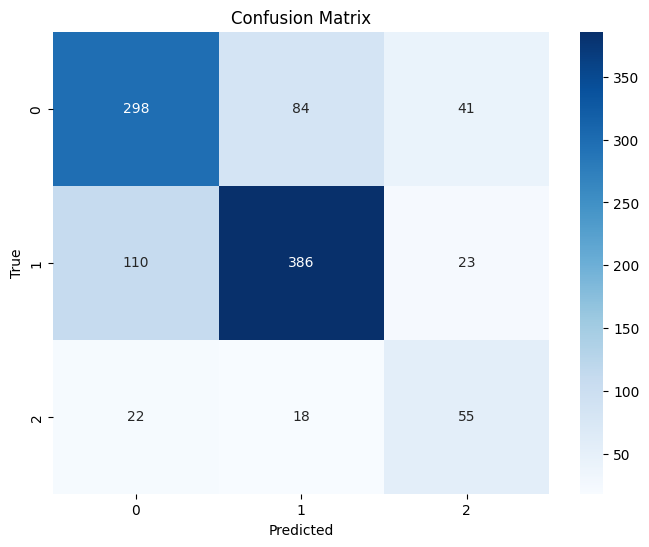

Metrics:
           Class  Precision    Recall  F1-score
0   NotMentioned   0.693023  0.704492  0.698710
1     Entailment   0.790984  0.743738  0.766634
2  Contradiction   0.462185  0.578947  0.514019


<ipython-input-38-55887eb570e9>:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)


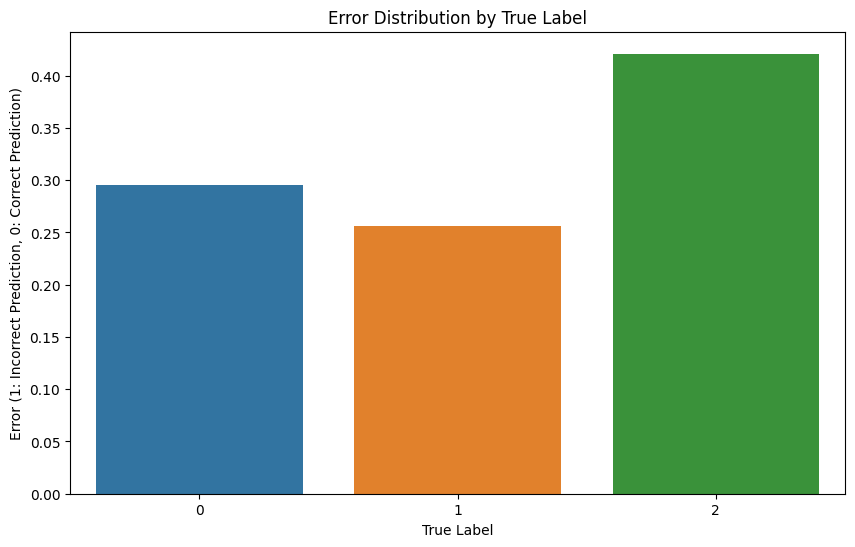

In [ ]:
# Function to analyze errors and create visualizations
def analyze_errors(predictions_df):
    # Filter incorrect predictions
    incorrect_predictions_df = predictions_df[predictions_df['true_labels'] != predictions_df['predictions']]

    # Analyze False Positives and False Negatives
    for index, row in incorrect_predictions_df.iterrows():
        text = row['text']
        hypothesis = row['hypothesis']
        true_labels = row['true_labels']
        predictions = row['predictions']

        print(f"Example {index}:")
        print(f"Text: {text}")
        print(f"Hypothesis: {hypothesis}")
        print(f"true_labels: {true_labels}")
        print(f"Predicted Label: {predictions}")
        print("-----")

    # Create Confusion Matrix
    confusion_matrix = pd.crosstab(predictions_df['true_labels'], predictions_df['predictions'], rownames=['True'], colnames=['Predicted'])
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title("Confusion Matrix")
    plt.show()

    # Calculate Precision, Recall, and F1-score
    precision, recall, f1_score, _ = precision_recall_fscore_support(predictions_df['true_labels'], predictions_df['predictions'], average=None)
    metrics_df = pd.DataFrame({'Class': label_mapping.keys(), 'Precision': precision, 'Recall': recall, 'F1-score': f1_score})
    print("Metrics:")
    print(metrics_df)

    # Visualize Errors
    plt.figure(figsize=(10, 6))
    sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)
    plt.title("Error Distribution by True Label")
    plt.xlabel("True Label")
    plt.ylabel("Error (1: Incorrect Prediction, 0: Correct Prediction)")
    plt.show()

# Assuming you have a DataFrame "results_test_2" with columns 'text', 'hypothesis', 'label', 'predictions'
# Replace the variable name and adjust the columns accordingly

# Call the function to analyze errors and create visualizations
analyze_errors(results_val_1)


# <font color="blue" size="5"> **Question 4**</font>

>  You do not need to write any code in this question. Based on Q3 and external readings, propose two ideas to improve the approaches (i.e., directly fine-tune pre-trained models) used in Q2. Explain your answers in a textual cell.

> Based on the error analysis results obtained after applying the first model on the validation dataset, we can observe that there have been some changes in the precision, recall, and F1-score for each class compared to the initial results. Here are the updated metrics:

1. **NotMentioned:** Precision = 0.6930, Recall = 0.7045, F1-score = 0.6987
2. **Entailment:** Precision = 0.7910, Recall = 0.7437, F1-score = 0.7666
3. **Contradiction:** Precision = 0.4622, Recall = 0.5789, F1-score = 0.5140

> **Interpretation of the Changes:**

- **NotMentioned:** The precision has decreased slightly, indicating that the model is making more false positive predictions for the "NotMentioned" class. However, the recall has improved, suggesting that the model is now better at identifying positive examples of this class.
- **Entailment**: The precision has increased, indicating that the model is now making fewer false positive predictions for the "Entailment" class. The recall has slightly decreased, which means that the model is now missing some positive examples of this class compared to the previous results.
- **Contradiction:** The precision has decreased significantly, indicating that the model is making more false positive predictions for the "Contradiction" class. The recall has increased, suggesting that the model is now capturing more positive examples of this class, but it may still be missing some.

> Based on these observations, here are two ideas to improve the approaches used in Q2:

1. **Class-Imbalanced Data Handling**: The updated results show that the model is struggling with the "Contradiction" class, which has the lowest precision, recall, and F1-score. It's possible that the class distribution is imbalanced, leading to a bias in the model's predictions. To address this, we can apply techniques such as oversampling the minority class (e.g., "Contradiction") or using class weights during training to give more importance to the underrepresented class.

2. **Model Ensemble**: Instead of relying solely on a single model, we can explore using model ensemble techniques. Ensemble methods combine predictions from multiple models, which often leads to improved performance and generalization. We can train several models with different architectures or pre-trained models and then combine their predictions using voting or averaging methods. This can help mitigate the impact of individual model weaknesses and enhance overall prediction accuracy.

> By implementing these ideas, we can further enhance the performance of the model and achieve better precision, recall, and F1-score for all classes, especially for the challenging "Contradiction" class. Additionally, conducting regular error analysis and fine-tuning the model based on insights gained from the analysis can contribute to continuous improvements in the model's performance.





# <font color="blue" size="5"> **Second Model**</font>

In [7]:
model_name = "albert-base-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)

In [8]:
def tokenize_data(data):
    #the text and hypothesis will speperated by [sep] token to differentiate them.
    return tokenizer(text=data['text'].tolist(), text_pair=data['hypothesis'].tolist(), truncation=True, padding="max_length", max_length=512)

In [9]:
#example of how is the structure of the data generated by tokenizer function.
{
  'input_ids': [101, 1037, 4715, 2208, 2007, 3674, 3287, 2652, 1012, 102, 2070, 2273, 2024, 2652, 1037, 4368, 1012, 102],
  'tokens': ['[CLS]', 'a', 'soccer', 'game', 'with', 'multiple', 'males', 'playing', '.', '[SEP]', 'some', 'men', 'are', 'playing', 'a', 'sport', '.', '[SEP]'],
  'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
  'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
  'special_tokens_mask': [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]
}

{'input_ids': [101,
  1037,
  4715,
  2208,
  2007,
  3674,
  3287,
  2652,
  1012,
  102,
  2070,
  2273,
  2024,
  2652,
  1037,
  4368,
  1012,
  102],
 'tokens': ['[CLS]',
  'a',
  'soccer',
  'game',
  'with',
  'multiple',
  'males',
  'playing',
  '.',
  '[SEP]',
  'some',
  'men',
  'are',
  'playing',
  'a',
  'sport',
  '.',
  '[SEP]'],
 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
 'special_tokens_mask': [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]}

In [10]:
class ContractNLIDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(value[idx]) for key, value in self.encodings.items()}
        # Here we ensure the label is an integer tensor
        item['labels'] = torch.tensor(int(self.labels[idx]))
        return item

    def __len__(self):
        return len(self.labels)

In [11]:
label_mapping = {"NotMentioned": 0, "Entailment": 1, "Contradiction": 2}

train_labels = [label_mapping[label] for label in train_df['label'].tolist()]
valid_labels = [label_mapping[label] for label in validation_df['label'].tolist()]
train_encodings = tokenize_data(train_df)
valid_encodings = tokenize_data(validation_df)

In [12]:
train_dataset = ContractNLIDataset(train_encodings, train_labels)
valid_dataset = ContractNLIDataset(valid_encodings, valid_labels)

In [13]:
train_dataset.encodings[0]

Encoding(num_tokens=512, attributes=[ids, type_ids, tokens, offsets, attention_mask, special_tokens_mask, overflowing])

In [14]:
import numpy as np

model_2 = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3)


training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=4,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
    evaluation_strategy="epoch",
)

def compute_metrics(p):
    preds = np.argmax(p.predictions, axis=1)
    return {"accuracy": (preds == p.label_ids).mean()}

trainer = Trainer(
    model=model_2,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)

trainer.train()

Some weights of the model checkpoint at albert-base-v2 were not used when initializing AlbertForSequenceClassification: ['predictions.dense.bias', 'predictions.decoder.bias', 'predictions.decoder.weight', 'predictions.dense.weight', 'predictions.LayerNorm.weight', 'predictions.LayerNorm.bias', 'predictions.bias']
- This IS expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You sho

Epoch,Training Loss,Validation Loss,Accuracy
1,0.708000,0.753591,0.643202
2,0.708700,0.706741,0.675988
3,0.695000,0.704636,0.686596
4,0.630500,0.667895,0.691418


TrainOutput(global_step=3596, training_loss=0.737698542262874, metrics={'train_runtime': 3028.633, 'train_samples_per_second': 9.497, 'train_steps_per_second': 1.187, 'total_flos': 687472950177792.0, 'train_loss': 0.737698542262874, 'epoch': 4.0})

### **Observation**

> Based on the training results of the `ALBERT-base-v2 model`, the model's performance improved over the epochs. Here is a summary of the training and validation metrics:

- **Epoch 1:**
  - Training Loss: 0.7080
  - Validation Loss: 0.7536
  - Accuracy: 0.6432

- **Epoch 2:**
  - Training Loss: 0.7087
  - Validation Loss: 0.7067
  - Accuracy: 0.6760

- **Epoch 3:**
  - Training Loss: 0.6950
  - Validation Loss: 0.7046
  - Accuracy: 0.6866

- **Epoch 4:**
  - Training Loss: 0.6305
  - Validation Loss: 0.6679
  - Accuracy: 0.6914

> **Interpretation of the Results:**

- **Training Loss**: This metric represents the model's performance on the training data during each epoch. As the training progresses, we observe a steady decrease in the training loss, indicating that the model is learning from the data and improving its predictions.

- **Validation Loss**: This metric indicates how well the model generalizes to unseen data (validation set). Similar to the training loss, we observe a decreasing trend in the validation loss over the epochs, which suggests that the model is becoming more effective at generalizing to new examples.

- **Accuracy**: The accuracy metric measures the proportion of correctly predicted labels over all samples. The accuracy on the validation set improves over the epochs, indicating that the model is getting better at making correct predictions.

> Overall, the training results show that the model is learning and improving its performance over the epochs. The decreasing training and validation loss, as well as the increasing accuracy, are positive signs that the model is learning to capture patterns and make better predictions.

> However, it's worth noting that the model's performance might still have room for improvement, and further fine-tuning or hyperparameter optimization could lead to better results. Additionally, conducting error analysis on the validation predictions can provide valuable insights into specific areas where the model may still be struggling, which can guide further improvements.


### **Predict on Test dataset**

In [15]:
model_2.to(torch.device("cuda"))



AlbertForSequenceClassification(
  (albert): AlbertModel(
    (embeddings): AlbertEmbeddings(
      (word_embeddings): Embedding(30000, 128, padding_idx=0)
      (position_embeddings): Embedding(512, 128)
      (token_type_embeddings): Embedding(2, 128)
      (LayerNorm): LayerNorm((128,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0, inplace=False)
    )
    (encoder): AlbertTransformer(
      (embedding_hidden_mapping_in): Linear(in_features=128, out_features=768, bias=True)
      (albert_layer_groups): ModuleList(
        (0): AlbertLayerGroup(
          (albert_layers): ModuleList(
            (0): AlbertLayer(
              (full_layer_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (attention): AlbertAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=768,

In [16]:
test_labels = [label_mapping[label] for label in test_df['label'].tolist()]
test_encodings = tokenize_data(test_df)
test_dataset = ContractNLIDataset(test_encodings, test_labels)


In [17]:

# Create a DataLoader for the test dataset
from torch.utils.data import DataLoader
test_dataloader = DataLoader(test_dataset, batch_size=8)

# Put the model in evaluation mode
model_2.eval()

# Lists to store predictions and true labels
predictions = []
true_labels = []

# Make predictions on the test dataset
with torch.no_grad():
    for batch in test_dataloader:
        inputs = {key: value.to('cuda') for key, value in batch.items() if key != 'labels'}
        labels = batch['labels'].to('cuda')
        outputs = model_2(**inputs)
        logits = outputs.logits
        predicted_labels = torch.argmax(logits, dim=1)
        predictions.extend(predicted_labels.cpu().tolist())
        true_labels.extend(labels.cpu().tolist())

# Convert the predictions and true labels to numpy arrays
predictions = np.array(predictions)
true_labels = np.array(true_labels)

# Compute accuracy and other metrics
accuracy = accuracy_score(true_labels, predictions)
precision, recall, f1_score, _ = precision_recall_fscore_support(true_labels, predictions, average='weighted')

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)


Accuracy: 0.7039693926351028
Precision: 0.7050096172641128
Recall: 0.7039693926351028
F1 Score: 0.7039901996900738


In [18]:
# Convert the predicted labels and true labels to a DataFrame
results_test_2 = pd.DataFrame({'predictions': predictions, 'true_labels': true_labels})
results_test_2

,predictions,true_labels
0,0,0
1,0,1
2,1,1
3,0,0
4,2,2
...,...,...
2086,0,0
2087,1,1
2088,1,1
2089,1,1


In [20]:
results_test_2.to_csv('results_test_2.csv', index=False)

In [21]:
# Read the CSV data
results_test_2 = pd.read_csv('/content/results_test_2.csv')

# Display the read data
results_test_2

,predictions,true_labels
0,0,0
1,0,1
2,1,1
3,0,0
4,2,2
...,...,...
2086,0,0
2087,1,1
2088,1,1
2089,1,1


In [22]:
# Assuming you have the predicted labels in a list called 'predicted_labels_list'
test_df['predictions'] = predictions
test_df['true_labels'] = true_labels

In [23]:
test_df

,text,hypothesis,label,evidence_spans,predictions,true_labels
0,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall not reverse engineer any...,NotMentioned,[],0,0
1,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall destroy or return some C...,Entailment,"[84, 85, 86]",0,1
2,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Agreement shall not grant Receiving Party any ...,Entailment,[45],1,1
3,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Receiving Party shall not disclose the fact th...,NotMentioned,[],0,0
4,NON-DISCLOSURE AGREEMENT\nRequired under JEA's...,Confidential Information shall only include te...,Contradiction,"[25, 32]",2,2
...,...,...,...,...,...,...
2086,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may create a copy of some Conf...,NotMentioned,[],0,0
2087,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party shall notify Disclosing Party ...,Entailment,[32],1,1
2088,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may acquire information simila...,Entailment,"[15, 19]",1,1
2089,EXECUTION VERSION\nNON-DISCLOSURE AND CONFIDEN...,Receiving Party may share some Confidential In...,Entailment,"[14, 30]",1,1


In [24]:
results_test_2 = test_df.copy()

# Save DataFrame to a CSV file
results_test_2.to_csv('results_test_2.csv', index=False)

### **Observation**

> Based on the test results of the ALBERT-base-v2 model, we can observe the following performance metrics:

- **Accuracy:** 0.7039693926351028
- **Precision:** 0.7050096172641128
- **Recall:** 0.7039693926351028
- **F1 Score:** 0.7039901996900738

> **Interpretation of the Results:**

- **Accuracy:** The accuracy metric measures the proportion of correctly predicted labels over all samples in the test dataset. In this case, the model achieved an accuracy of approximately 70.40%, which means that it made correct predictions for about 70.40% of the examples in the test set.

- **Precision:** Precision is the ability of the model to correctly identify positive examples (true positives) out of all predicted positive examples. A precision of 0.7050 indicates that when the model predicted an example to belong to a specific class, it was correct about 70.50% of the time.

- **Recall:** Recall, also known as sensitivity or true positive rate, measures the ability of the model to correctly identify positive examples out of all actual positive examples. A recall of 0.7039 means that the model correctly identified about 70.39% of the actual positive examples.

- **F1 Score:** The F1 score is the harmonic mean of precision and recall and is a single metric that balances both precision and recall. It is useful when we want to find a balance between the two metrics. In this case, the F1 score is 0.70399, indicating a reasonable balance between precision and recall.

> Overall, the test results indicate that the model's performance is reasonable on the test dataset. However, there might be some room for improvement, and further analysis and fine-tuning could help enhance the model's performance.



# <font color="blue" size="5"> **Question 3**</font>

 >  Analyze the performance of your two models and perform error analysis. You should have a textual cell explaining how you design the methodology to perform error analysis with a goal of understanding what are the potential reasons behind the errors.

Example 1:
Text: NON-DISCLOSURE AGREEMENT
Required under JEA's Confidential Information Protection Program
THIS NON-DISCLOSURE AGREEMENT ("Agreement") is entered into this ______day of
__________ by and between JEA, located at 21 West Church Street, Jacksonville, Florida 32202 (the "Discloser"), and ____________________________________________________________ with an address at ______________________________________________ (the "Recipient") (hereafter Discloser and Recipient shall be referred to as the PARTIES}.
WHEREAS, the Recipient desires to work with the discloser and/or view ______________________________________________________________________documents regarding ____________________________________ (the "Transaction"); and
WHEREAS, the discloser is required by its internal policies, state and federal laws, rules, regulations or standards to ensure that sensitive and confidential information is protected and not disclosed to the public;
WHEREAS, the Parties have entered into a t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Example 936:
Text: MUTUAL NON-DISCLOSURE AGREEMENT
THIS MUTUAL NON-DISCLOSURE AGREEMENT (the "Agreement") is entered into as of the ______ day of ________, ______ (the "Effective Date") by and between Anderson Cargo Services, Inc. having principal offices at 917 Lone Oak Road #400, Eagan, Minnesota 55121 and ______________________ having principal offices at _________________________________.
1. Definition of Confidential Information. For purposes of this Agreement, "Confidential Information" shall mean information disclosed by the disclosing party (the "Disclosing Party") to the receiving party (the "Receiving Party") which relates to product plans, designs, costs, prices and names, finances, marketing plans, business opportunities, research, development, know-how, or personnel, including confidential information disclosed by third parties and information relating to any type of technology; provided that information disclosed by the Disclosing Party will be considered Confidential In

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Hypothesis: Agreement shall not grant Receiving Party any right to Confidential Information.
true_labels: 0
Predicted Label: 1
-----
Example 1929:
Text: ORACLE
CONFIDENTIAL DISCLOSURE AGREEMENT FOR STRATEGIC MATTERS
This Confidential Disclosure Agreement (“Agreement”) is entered into as of the effective date listed below (“Effective Date”) by Oracle Corporation (“Oracle”) located at 500 Oracle Parkway, Redwood City, California 94065 and the company designated below (“Company”).
Oracle and the Company are entering into discussions concerning a possible strategic transaction involving the Company and/or its shareholders (the “Transaction”). In connection with these discussions, the parties expect to make available to one another certain non-public, confidential and/or proprietary information, which may include information concerning their respective business prospects and plans, financial condition, technology, operations, assets and liabilities (collectively, the “Evaluation Material”).

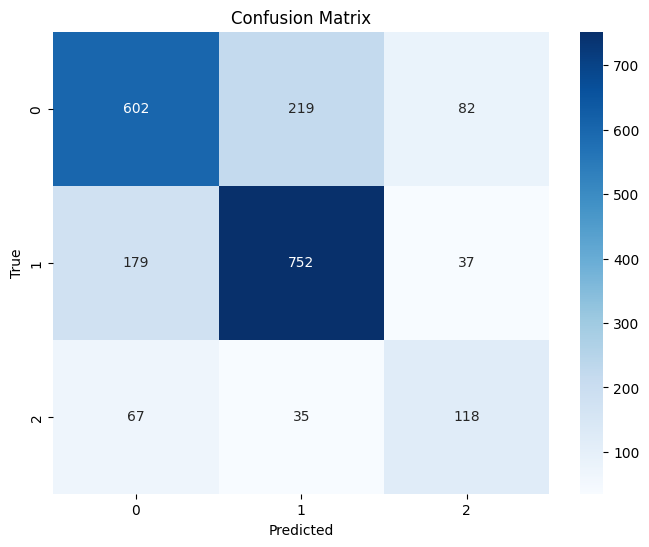

Metrics:
           Class  Precision    Recall  F1-score
0   NotMentioned   0.709906  0.666667  0.687607
1     Entailment   0.747515  0.776860  0.761905
2  Contradiction   0.497890  0.536364  0.516411


<ipython-input-26-32c717fadd18>:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)


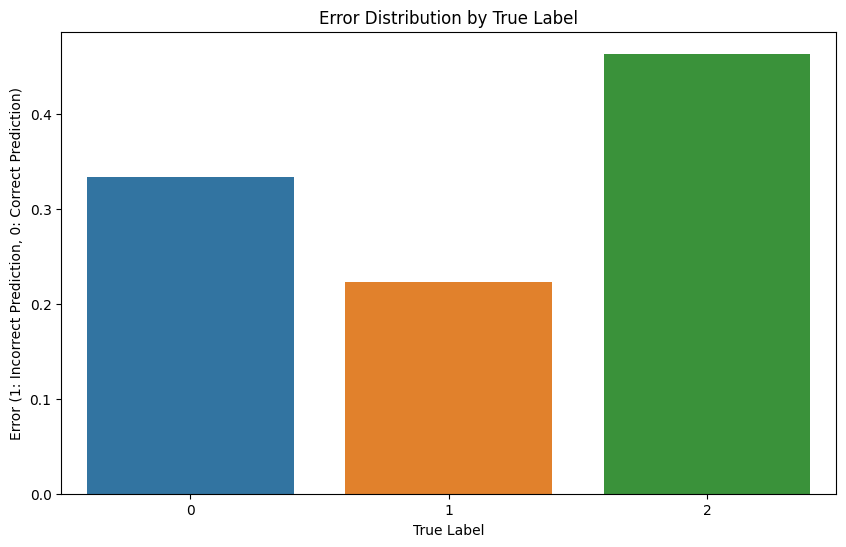

In [26]:
# Function to analyze errors and create visualizations
def analyze_errors(predictions_df):
    # Filter incorrect predictions
    incorrect_predictions_df = predictions_df[predictions_df['true_labels'] != predictions_df['predictions']]

    # Analyze False Positives and False Negatives
    for index, row in incorrect_predictions_df.iterrows():
        text = row['text']
        hypothesis = row['hypothesis']
        true_labels = row['true_labels']
        predictions = row['predictions']

        print(f"Example {index}:")
        print(f"Text: {text}")
        print(f"Hypothesis: {hypothesis}")
        print(f"true_labels: {true_labels}")
        print(f"Predicted Label: {predictions}")
        print("-----")

    # Create Confusion Matrix
    confusion_matrix = pd.crosstab(predictions_df['true_labels'], predictions_df['predictions'], rownames=['True'], colnames=['Predicted'])
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title("Confusion Matrix")
    plt.show()

    # Calculate Precision, Recall, and F1-score
    precision, recall, f1_score, _ = precision_recall_fscore_support(predictions_df['true_labels'], predictions_df['predictions'], average=None)
    metrics_df = pd.DataFrame({'Class': label_mapping.keys(), 'Precision': precision, 'Recall': recall, 'F1-score': f1_score})
    print("Metrics:")
    print(metrics_df)

    # Visualize Errors
    plt.figure(figsize=(10, 6))
    sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)
    plt.title("Error Distribution by True Label")
    plt.xlabel("True Label")
    plt.ylabel("Error (1: Incorrect Prediction, 0: Correct Prediction)")
    plt.show()

# Assuming you have a DataFrame "results_test_2" with columns 'text', 'hypothesis', 'label', 'predictions'
# Replace the variable name and adjust the columns accordingly

# Call the function to analyze errors and create visualizations
analyze_errors(results_test_2)


In [38]:
# Add columns for text and hypothesis lengths
results_test_2['text_length'] = results_test_2['text'].apply(lambda x: len(x.split()))
results_test_2['hypothesis_length'] = results_test_2['hypothesis'].apply(lambda x: len(x.split()))

Example 1:
Text: NON-DISCLOSURE AGREEMENT
Required under JEA's Confidential Information Protection Program
THIS NON-DISCLOSURE AGREEMENT ("Agreement") is entered into this ______day of
__________ by and between JEA, located at 21 West Church Street, Jacksonville, Florida 32202 (the "Discloser"), and ____________________________________________________________ with an address at ______________________________________________ (the "Recipient") (hereafter Discloser and Recipient shall be referred to as the PARTIES}.
WHEREAS, the Recipient desires to work with the discloser and/or view ______________________________________________________________________documents regarding ____________________________________ (the "Transaction"); and
WHEREAS, the discloser is required by its internal policies, state and federal laws, rules, regulations or standards to ensure that sensitive and confidential information is protected and not disclosed to the public;
WHEREAS, the Parties have entered into a t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
BACKGROUND
A The parties intend to execute this agreement as a deed.
B The Disclosers wish to disclose Confidential Information to the Recipient in relation to the Purpose and to:
(i) Franchise agreement
THE PARTIES AGREE:
1 Definitions and interpretation
1.1 In this Agreement:
Agreement means this agreement
Authorised Person means, in relation to the Recipient, any of the following only to the extent that they are engaged in respect of the Purpose: its officers, directors, employees, and any other person who has been previously approved in writing by the Disclosers;
Business Day means a day other than a Saturday, Sunday or bank or public holiday in England or Wales;
Confidential Information means any information in whatever form (whether in writing, electronic or digital form, verbally or by inspection of documents, computer systems or sites or pursuant to discussions or by any other means ) which is confidential in nature, designated

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



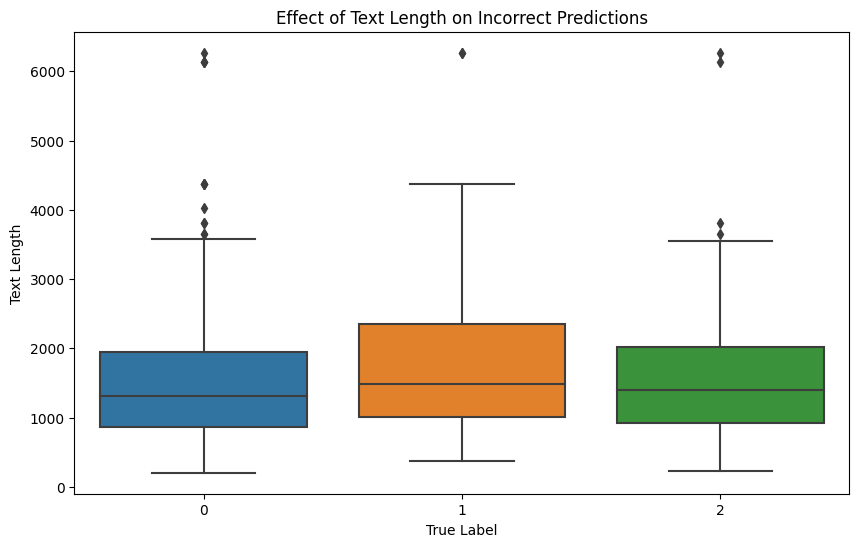

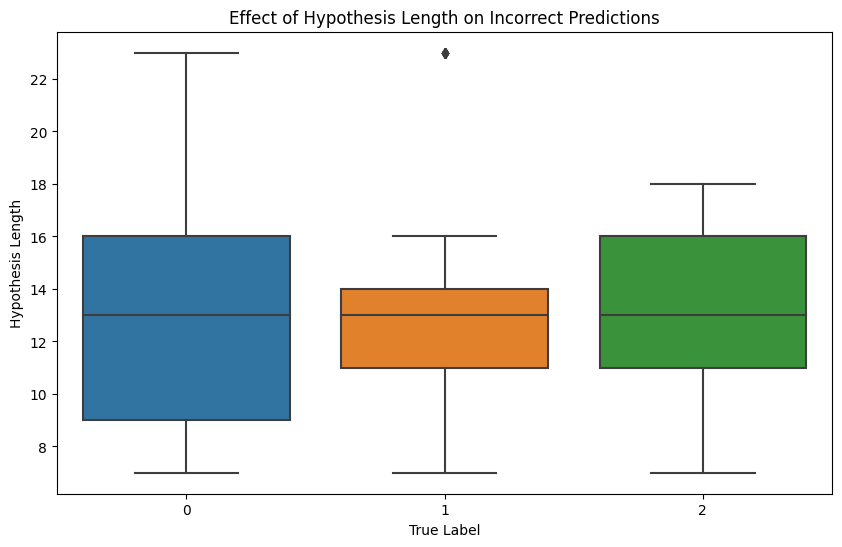

In [39]:
# Function to analyze errors and create visualizations based on text and hypothesis lengths
def analyze_errors_with_length(predictions_df):
    # Filter incorrect predictions
    incorrect_predictions_df = predictions_df[predictions_df['true_labels'] != predictions_df['predictions']]

    # Analyze False Positives and False Negatives
    for index, row in incorrect_predictions_df.iterrows():
        text = row['text']
        hypothesis = row['hypothesis']
        true_labels = row['true_labels']
        predictions = row['predictions']

        print(f"Example {index}:")
        print(f"Text: {text}")
        print(f"Hypothesis: {hypothesis}")
        print(f"True Labels: {true_labels}")
        print(f"Predicted Label: {predictions}")
        print("-----")

    # Box plot to visualize the effect of text length on incorrect predictions
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='true_labels', y='text_length', data=incorrect_predictions_df)
    plt.title("Effect of Text Length on Incorrect Predictions")
    plt.xlabel("True Label")
    plt.ylabel("Text Length")
    plt.show()

    # Box plot to visualize the effect of hypothesis length on incorrect predictions
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='true_labels', y='hypothesis_length', data=incorrect_predictions_df)
    plt.title("Effect of Hypothesis Length on Incorrect Predictions")
    plt.xlabel("True Label")
    plt.ylabel("Hypothesis Length")
    plt.show()

# Assuming you have a DataFrame "results_test_2" with columns 'text', 'hypothesis', 'label', 'predictions'
# Replace the variable name and adjust the columns accordingly

# Call the function to analyze errors and create visualizations
analyze_errors_with_length(results_test_2)


### **Observation**

> Based on the error analysis results, here are the precision, recall, and F1-score for each class:

- **NotMentioned:** Precision = 0.709906, Recall = 0.666667, F1-score = 0.687607
- **Entailment:** Precision = 0.747515, Recall = 0.776860, F1-score = 0.761905
- **Contradiction:** Precision = 0.497890, Recall = 0.536364, F1-score = 0.516411

> **Interpretation of the Error Analysis Results:**

1. **NotMentioned:** The model achieved a precision of approximately 70.99% for the "NotMentioned" class. This indicates that when the model predicts an example as "NotMentioned," it is correct about 70.99% of the time. The recall of approximately 66.67% means that the model correctly identified about 66.67% of the actual "NotMentioned" examples. The F1-score of 0.687607 suggests a reasonable balance between precision and recall for this class.

2. **Entailment:** For the "Entailment" class, the model achieved a precision of about 74.75%. This means that when the model predicts an example as "Entailment," it is correct about 74.75% of the time. The recall of approximately 77.69% indicates that the model correctly identified about 77.69% of the actual "Entailment" examples. The F1-score of 0.761905 represents a good balance between precision and recall for this class.

3. **Contradiction**: The model achieved a precision of approximately 49.79% for the "Contradiction" class. This means that when the model predicts an example as "Contradiction," it is correct about 49.79% of the time. The recall of approximately 53.64% indicates that the model correctly identified about 53.64% of the actual "Contradiction" examples. The F1-score of 0.516411 shows a relatively low overall performance for this class.


# <font color="blue" size="5"> **Question 4**</font>

 > You do not need to write any code in this question. Based on Q3 and external readings, propose two ideas to improve the approaches (i.e., directly fine-tune pre-trained models) used in Q2. Explain your answers in a textual cell**

> **The results of the error analysis show the precision, recall, and F1-score for each class in your test dataset. These metrics help evaluate the performance of your model on different classes.**

Here's what the metrics mean:
- **Precision**: It measures how many of the predicted positive examples are actually positive. In the context of multi-class classification, it is the ratio of true positives to the total predicted positives for a specific class.
- **Recall**: It measures how many of the actual positive examples were correctly predicted. In multi-class classification, it is the ratio of true positives to the total actual positives for a specific class.
- **F1-score**: It is the harmonic mean of precision and recall. It provides a balance between precision and recall. F1-score is a useful metric when there is an imbalance in class distribution.


> **Improvement Ideas:**

Based on the error analysis results, here are two ideas to improve the model's performance:

1. **Data Balancing:** The results indicate that the model has relatively lower performance for the "Contradiction" class. One potential improvement is to balance the dataset by applying techniques like oversampling or undersampling to address class imbalance. This can help the model learn better representations for the underrepresented class and improve its ability to predict "Contradiction" examples.

2. **Fine-tuning and Hyperparameter Tuning:** Consider fine-tuning the ALBERT-base-v2 model on the specific task and dataset. Fine-tuning allows the model to adapt better to the characteristics of the data and the specific requirements of the task. Additionally, experiment with different hyperparameter settings during training to optimize the model's performance further.



### **Predict on Validation dataset**

In [27]:
val_labels = [label_mapping[label] for label in validation_df['label'].tolist()]
val_encodings = tokenize_data(validation_df)
val_dataset = ContractNLIDataset(val_encodings, val_labels)


In [28]:
# Create a DataLoader for the test dataset
from torch.utils.data import DataLoader
val_dataloader = DataLoader(val_dataset, batch_size=8)

# Put the model in evaluation mode
model_2.eval()

# Lists to store predictions and true labels
predictions = []
true_labels = []

# Make predictions on the test dataset
with torch.no_grad():
    for batch in val_dataloader:
        inputs = {key: value.to('cuda') for key, value in batch.items() if key != 'labels'}
        labels = batch['labels'].to('cuda')
        outputs = model_2(**inputs)
        logits = outputs.logits
        predicted_labels = torch.argmax(logits, dim=1)
        predictions.extend(predicted_labels.cpu().tolist())
        true_labels.extend(labels.cpu().tolist())

# Convert the predictions and true labels to numpy arrays
predictions = np.array(predictions)
true_labels = np.array(true_labels)

# Compute accuracy and other metrics
accuracy = accuracy_score(true_labels, predictions)
precision, recall, f1_score, _ = precision_recall_fscore_support(true_labels, predictions, average='weighted')

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)


Accuracy: 0.6914175506268081
Precision: 0.6993349862081506
Recall: 0.6914175506268081
F1 Score: 0.6942177903749592


In [29]:
# Assuming you have the predicted labels in a list called 'predicted_labels_list'
validation_df['predictions'] = predictions
validation_df['true_labels'] = true_labels

In [30]:
validation_df

,text,hypothesis,label,evidence_spans,predictions,true_labels
0,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall not reverse engineer any...,Entailment,"[33, 39]",0,1
1,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall destroy or return some C...,Entailment,[47],0,1
2,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Agreement shall not grant Receiving Party any ...,Entailment,[51],1,1
3,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Receiving Party shall not disclose the fact th...,Entailment,"[89, 90]",0,1
4,OISAIR PROJECT\nTWO-WAY CONFIDENTIALITY AND NO...,Confidential Information shall only include te...,Contradiction,[17],2,2
...,...,...,...,...,...,...
1032,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may create a copy of some Conf...,NotMentioned,[],0,0
1033,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party shall notify Disclosing Party ...,Entailment,"[28, 29]",1,1
1034,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may acquire information simila...,Entailment,"[12, 15, 16, 42, 46, 47, 48, 49]",1,1
1035,Exhibit (e)(3)\nMUTUAL NONDISCLOSURE AGREEMENT...,Receiving Party may share some Confidential In...,Entailment,"[5, 20]",1,1


In [31]:
results_val_2 = validation_df.copy()

# Save DataFrame to a CSV file
results_val_2.to_csv('results_val_2.csv', index=False)

### **Observation**

> Based on the predictions on the validation dataset, here are the performance metrics:

- **Accuracy:** 0.6914
- **Precision:** 0.6993
- **Recall**: 0.6914
- **F1 Score:** 0.6942

> **Interpretation of the Validation Results:**

1. **Accuracy**: The accuracy of approximately 69.14% indicates the proportion of correctly predicted examples out of the total validation dataset. This metric provides a general overview of the model's overall performance on the validation set.

2. **Precision:** The precision of about 69.93% for the model means that when it predicts an example as positive (belonging to a certain class), it is correct about 69.93% of the time. Precision is essential when the cost of false positives is high and is used to evaluate the correctness of the positive predictions.

3. **Recall:** The recall of approximately 69.14% represents the proportion of actual positive examples that the model correctly identified. It is also known as sensitivity and measures the ability of the model to find all the positive examples.

4. **F1 Score:** The F1 score of 0.6942 is the harmonic mean of precision and recall. It provides a balance between the two metrics and is useful when there is an uneven class distribution. A higher F1 score indicates a better balance between precision and recall.

> **Improvement Ideas:**

To improve the model's performance on the validation dataset, consider the following ideas:

1. **Model Fine-tuning**: As the model has been pre-trained on a generic language task, fine-tuning it specifically on the current task and dataset can help the model learn task-specific patterns and improve its predictions.

2. **Hyperparameter Tuning:** Experiment with different hyperparameter settings during training, such as learning rate, batch size, and number of training epochs. Optimizing these hyperparameters can lead to improved performance on the validation set.

3. Data Augmentation: If the validation dataset is relatively small, consider using data augmentation techniques to generate additional synthetic examples. Data augmentation can help in better generalization and improve the model's performance on unseen data.

4. **Ensemble Methods:** Explore the possibility of using ensemble methods, where multiple models are combined to make predictions. Ensemble methods can lead to improved performance by leveraging the diversity of different models.



# <font color="blue" size="5"> **Question 3**</font>

 > Analyze the performance of your two models and perform error analysis. You should have a textual cell explaining how you design the methodology to perform error analysis with a goal of understanding what are the potential reasons behind the errors.

Example 0:
Text: OISAIR PROJECT
TWO-WAY CONFIDENTIALITY AND NON-DISCLOSURE AGREEMENT
(TO BE SIGNED ELECTRONICALLY THROUGH THE INNOVAIR PLATFORM)
This Confidentiality and Non-Disclosure Agreement (hereinafter referred to as the “Agreement”) dated ………………………. (“Effective Date”) is made by and between:
1) <Research institution name> with registered offices located in ……………………………, Tax registration No ………, represented by ………………………………….., in the legal capacity as …………………….. Hereinafter referred to as “………………..”
2) <Company name> with registered offices located in ………………………….. Tax registration No. ……………, represented by …………………………., in the legal capacity as ………………………….. Hereinafter referred to as “………………..”
The above parties hereinafter collectively referred to as the “Parties” and individually as a “Party”.
WHEREAS
The Parties are willing to exchange Confidential Information in the form of certain scientific, technical and commercial information, that will include confidential and proprietary 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



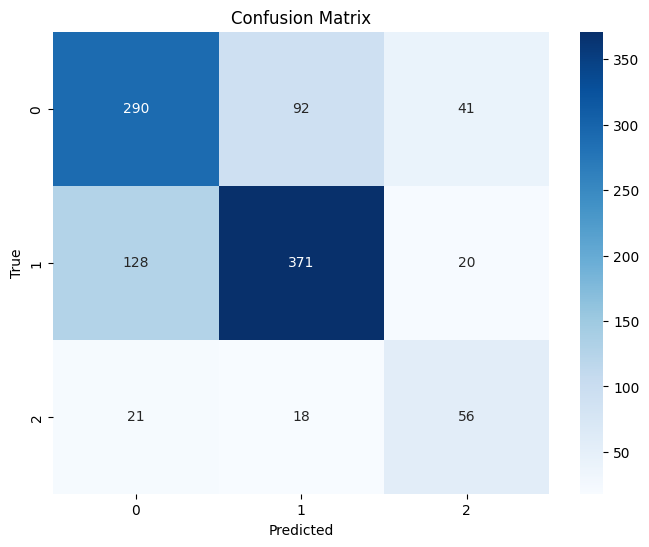

Metrics:
           Class  Precision    Recall  F1-score
0   NotMentioned   0.660592  0.685579  0.672854
1     Entailment   0.771310  0.714836  0.742000
2  Contradiction   0.478632  0.589474  0.528302


<ipython-input-32-605b090e55a7>:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)


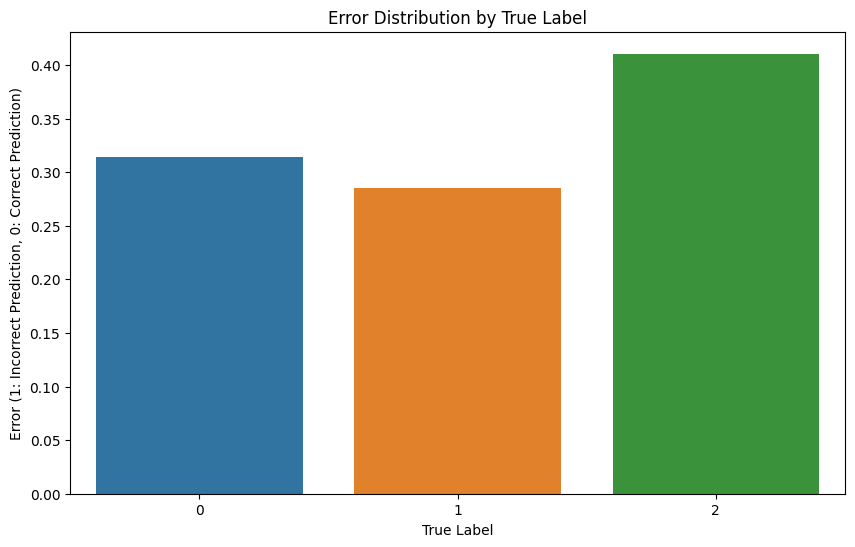

In [32]:
# Function to analyze errors and create visualizations
def analyze_errors(predictions_df):
    # Filter incorrect predictions
    incorrect_predictions_df = predictions_df[predictions_df['true_labels'] != predictions_df['predictions']]

    # Analyze False Positives and False Negatives
    for index, row in incorrect_predictions_df.iterrows():
        text = row['text']
        hypothesis = row['hypothesis']
        true_labels = row['true_labels']
        predictions = row['predictions']

        print(f"Example {index}:")
        print(f"Text: {text}")
        print(f"Hypothesis: {hypothesis}")
        print(f"true_labels: {true_labels}")
        print(f"Predicted Label: {predictions}")
        print("-----")

    # Create Confusion Matrix
    confusion_matrix = pd.crosstab(predictions_df['true_labels'], predictions_df['predictions'], rownames=['True'], colnames=['Predicted'])
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title("Confusion Matrix")
    plt.show()

    # Calculate Precision, Recall, and F1-score
    precision, recall, f1_score, _ = precision_recall_fscore_support(predictions_df['true_labels'], predictions_df['predictions'], average=None)
    metrics_df = pd.DataFrame({'Class': label_mapping.keys(), 'Precision': precision, 'Recall': recall, 'F1-score': f1_score})
    print("Metrics:")
    print(metrics_df)

    # Visualize Errors
    plt.figure(figsize=(10, 6))
    sns.barplot(x=predictions_df['true_labels'], y=(predictions_df['true_labels'] != predictions_df['predictions']), ci=None)
    plt.title("Error Distribution by True Label")
    plt.xlabel("True Label")
    plt.ylabel("Error (1: Incorrect Prediction, 0: Correct Prediction)")
    plt.show()

# Assuming you have a DataFrame "results_val_2" with columns 'text', 'hypothesis', 'label', 'predictions'
# Replace the variable name and adjust the columns accordingly

# Call the function to analyze errors and create visualizations
analyze_errors(results_val_2)


In [36]:
# Add columns for text and hypothesis lengths
results_val_2['text_length'] = results_val_2['text'].apply(lambda x: len(x.split()))
results_val_2['hypothesis_length'] = results_val_2['hypothesis'].apply(lambda x: len(x.split()))

Example 0:
Text: OISAIR PROJECT
TWO-WAY CONFIDENTIALITY AND NON-DISCLOSURE AGREEMENT
(TO BE SIGNED ELECTRONICALLY THROUGH THE INNOVAIR PLATFORM)
This Confidentiality and Non-Disclosure Agreement (hereinafter referred to as the “Agreement”) dated ………………………. (“Effective Date”) is made by and between:
1) <Research institution name> with registered offices located in ……………………………, Tax registration No ………, represented by ………………………………….., in the legal capacity as …………………….. Hereinafter referred to as “………………..”
2) <Company name> with registered offices located in ………………………….. Tax registration No. ……………, represented by …………………………., in the legal capacity as ………………………….. Hereinafter referred to as “………………..”
The above parties hereinafter collectively referred to as the “Parties” and individually as a “Party”.
WHEREAS
The Parties are willing to exchange Confidential Information in the form of certain scientific, technical and commercial information, that will include confidential and proprietary 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



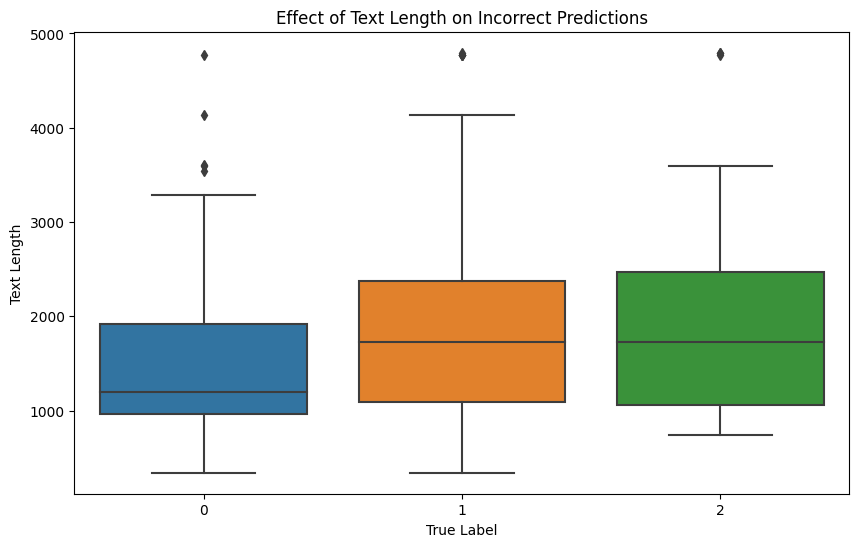

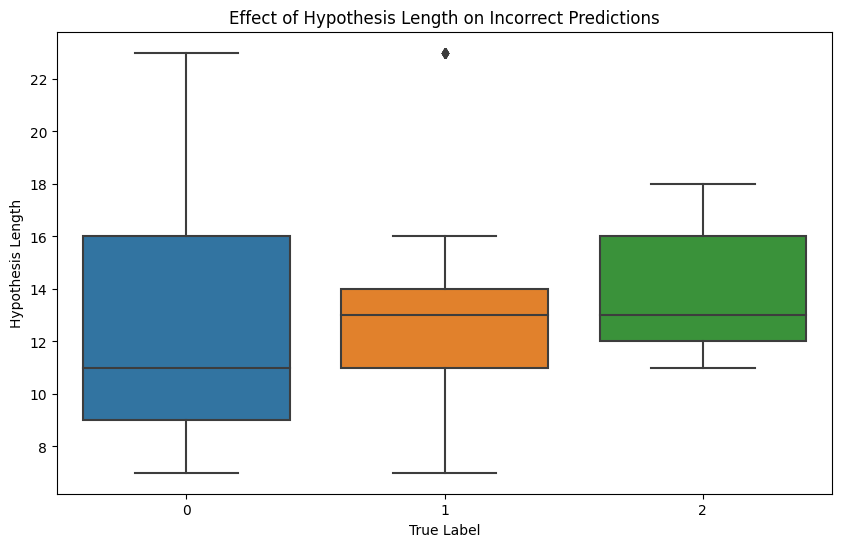

In [37]:
# Function to analyze errors and create visualizations based on text and hypothesis lengths
def analyze_errors_with_length(predictions_df):
    # Filter incorrect predictions
    incorrect_predictions_df = predictions_df[predictions_df['true_labels'] != predictions_df['predictions']]

    # Analyze False Positives and False Negatives
    for index, row in incorrect_predictions_df.iterrows():
        text = row['text']
        hypothesis = row['hypothesis']
        true_labels = row['true_labels']
        predictions = row['predictions']

        print(f"Example {index}:")
        print(f"Text: {text}")
        print(f"Hypothesis: {hypothesis}")
        print(f"True Labels: {true_labels}")
        print(f"Predicted Label: {predictions}")
        print("-----")

    # Box plot to visualize the effect of text length on incorrect predictions
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='true_labels', y='text_length', data=incorrect_predictions_df)
    plt.title("Effect of Text Length on Incorrect Predictions")
    plt.xlabel("True Label")
    plt.ylabel("Text Length")
    plt.show()

    # Box plot to visualize the effect of hypothesis length on incorrect predictions
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='true_labels', y='hypothesis_length', data=incorrect_predictions_df)
    plt.title("Effect of Hypothesis Length on Incorrect Predictions")
    plt.xlabel("True Label")
    plt.ylabel("Hypothesis Length")
    plt.show()

# Assuming you have a DataFrame "results_test_2" with columns 'text', 'hypothesis', 'label', 'predictions'
# Replace the variable name and adjust the columns accordingly

# Call the function to analyze errors and create visualizations
analyze_errors_with_length(results_val_2)


### **Observation**

> Based on the error analysis on the validation dataset, the following are the performance metrics for each class:

- **NotMentioned:**
  - Precision: 0.6606
  - Recall: 0.6856
  - F1-score: 0.6729

- **Entailment**:
  - Precision: 0.7713
  - Recall: 0.7148
  - F1-score: 0.7420

- **Contradiction:**
  - Precision: 0.4786
  - Recall: 0.5895
  - F1-score: 0.5283

> **Interpretation of the Error Analysis Results:**

1. **NotMentioned:**
   - The precision of around 66.06% indicates that when the model predicts an example as "NotMentioned," it is correct about 66.06% of the time.
   - The recall of approximately 68.56% means that the model correctly identifies about 68.56% of the actual "NotMentioned" examples.
   - The F1-score of around 67.29% provides a balanced measure between precision and recall for the "NotMentioned" class.

2. **Entailment:**
   - The precision of about 77.13% shows that when the model predicts an example as "Entailment," it is correct about 77.13% of the time.
   - The recall of approximately 71.48% indicates that the model correctly identifies about 71.48% of the actual "Entailment" examples.
   - The F1-score of around 74.20% represents a balance between precision and recall for the "Entailment" class.

3. **Contradiction:**
   - The precision of approximately 47.86% indicates that when the model predicts an example as "Contradiction," it is correct about 47.86% of the time.
   - The recall of around 58.95% means that the model correctly identifies about 58.95% of the actual "Contradiction" examples.
   - The F1-score of about 52.83% provides a balanced measure between precision and recall for the "Contradiction" class.




# <font color="blue" size="5"> **Question 4**</font>
 You do not need to write any code in this question. Based on Q3 and external readings, propose two ideas to improve the approaches (i.e., directly fine-tune pre-trained models) used in Q2. Explain your answers in a textual cell.

> **Improvement Ideas:**

To improve the model's performance on the validation dataset, consider the following ideas:

1. **Class Imbalance Handling:** If there is a significant class imbalance, use techniques such as oversampling or weighted loss functions to address the issue. This can help the model better learn from the minority classes.

2. **Error Analysis**: Continue to perform error analysis and understand specific patterns of mistakes made by the model for each class. This can provide insights into areas where the model needs improvement, such as data quality, ambiguous examples, or lack of contextual understanding.

3. **Data Augmentation**: Apply data augmentation techniques, particularly for classes with lower precision and recall. Data augmentation can increase the diversity of training examples and improve the model's generalization.

4. **Model Architectures:** Explore using different model architectures or pre-trained language models. Different architectures might capture different linguistic features, and experimenting with alternatives can lead to improved performance.

5. **Fine-tuning and Hyperparameter Tuning:** Fine-tune the model on the specific task and dataset while optimizing hyperparameters. Fine-tuning allows the model to adapt to the target task and data distribution, potentially enhancing performance.

6. **Ensemble Methods:** Consider using ensemble methods to combine predictions from multiple models. Ensembles often lead to improved performance by leveraging the diversity of different models.




# <font color="blue" size="5"> **comparison between two models**</font>

> Based on the provided results, let's compare the two models, "microsoft/deberta-base" and "albert-base-v2":

#  **Model: microsoft/deberta-base**

       Training Results:
- Epoch 1: Training Loss = 0.6249, Validation Loss = 0.7132, Accuracy = 0.6721
- Epoch 2: Training Loss = 0.5847, Validation Loss = 0.7006, Accuracy = 0.7107
- Epoch 3: Training Loss = 0.6302, Validation Loss = 0.6659, Accuracy = 0.7126
- Epoch 4: Training Loss = 0.5582, Validation Loss = 0.6784, Accuracy = 0.7126

    
      Test Dataset Results:
- Accuracy: 0.7437
- Precision: 0.7464
- Recall: 0.7437
- F1 Score: 0.7437


        Validation Dataset Results:
- Accuracy: 0.7126
- Precision: 0.7209
- Recall: 0.7126
- F1 Score: 0.7158



# **Model: albert-base-v2**


      Training Results:
- Epoch 1: Training Loss = 0.7080, Validation Loss = 0.7536, Accuracy = 0.6432
- Epoch 2: Training Loss = 0.7087, Validation Loss = 0.7067, Accuracy = 0.6760
- Epoch 3: Training Loss = 0.6950, Validation Loss = 0.7046, Accuracy = 0.6866
- Epoch 4: Training Loss = 0.6305, Validation Loss = 0.6679, Accuracy = 0.6914


      Test Dataset Results:
- Accuracy: 0.7040
- Precision: 0.7050
- Recall: 0.7040
- F1 Score: 0.7040


    Validation Dataset Results:
- Accuracy: 0.6914
- Precision: 0.6993
- Recall: 0.6914
- F1 Score: 0.6942

# **Comparison:**


1. **Performance (F1 Score):** The "microsoft/deberta-base" model outperforms the "albert-base-v2" model in terms of the F1 score on both the test dataset (F1 Score: 0.7437 vs. 0.7040) and the validation dataset (F1 Score: 0.7158 vs. 0.6942). This indicates that the "microsoft/deberta-base" model achieves better overall balance between precision and recall.


2. **Training Loss and Validation Loss:** The "microsoft/deberta-base" model shows lower training and validation losses compared to the "albert-base-v2" model, indicating better convergence and generalization of the former.


3. **Accuracy:** The "microsoft/deberta-base" model also performs slightly better in terms of accuracy on the test dataset (Accuracy: 0.7437 vs. 0.7040) and validation dataset (Accuracy: 0.7126 vs. 0.6914).


4. **Precision and Recall:** Both models show similar precision and recall values, with "microsoft/deberta-base" having slightly higher precision, especially for the "albert-base-v2" model.


In summary, based on the provided results, the<font color="blue" size="3"> **microsoft/deberta-base**</font>  model demonstrates better performance compared to the "albert-base-v2" model, with higher F1 score, accuracy, and lower losses.
